# <center> **Clustering: Earthquake Dataset**

# Table of Contents

1. **[Functions](#1)**
2. **[EDA](#2)**
  * [Check missing data](#sub-heading1)
  * [Look at data](#sub-heading2)
  * [Dropping duplicates](#sub-heading3)
  * [Distributions](#sub-heading4)
  * [Correlation](#sub-heading)
  * [Outliers](#sub-heading)
  * [Removing the outliers](#sub-heading)
  * [Imputing the missing data](#sub-heading)
3. **[Standartisation](#3)**
4. **[Clustering of earthquakes](#4)**
* [KMeans](#sub-heading)
     - [K-Means with 15 clusters](#sub-sub-heading)
     - [Choose optimal number of clusters for K-Means](#sub-sub-heading)
* [Hierarchical clustering](#sub-heading)
     - [Euclidean distance](#sub-sub-heading)
* [DBSCAN](#sub-heading1)
* [OPTICS](#sub-heading2)
5. **[Metrics](#5)**
   * [Labelled metrics](#sub-heading)
   * [Unlabeled metrics](#sub-heading)
6. **[Interpretation of the resulting KMeans clusters](#6)**
7. **[The world map](#7)**
8. **[General conclusion](#8)**



In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import style
style.use('seaborn')
%matplotlib inline
#graphs in svg look clearer
%config InlineBackend.figure_format = 'svg' 
import warnings
warnings.simplefilter('ignore')

import pylab as pl

import folium
from folium import Choropleth
from folium.plugins import HeatMap

from scipy import stats
from scipy.stats import shapiro
from scipy.stats import normaltest
from scipy.stats import anderson
from scipy.stats import norm
import statsmodels.stats.api as sms
from statsmodels.compat import lzip
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.diagnostic import het_breuschpagan
from scipy.spatial.distance import pdist, squareform, cdist
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from sklearn import preprocessing
from sklearn.cluster import DBSCAN, KMeans
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn.neighbors import NearestNeighbors 
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer, SimpleImputer
from sklearn.preprocessing import OneHotEncoder, FunctionTransformer, StandardScaler, PolynomialFeatures
from sklearn.compose import ColumnTransformer
from sklearn import metrics
from sklearn.model_selection import KFold, StratifiedKFold, cross_val_score, GridSearchCV
from sklearn.pipeline import make_pipeline

In [ ]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [ ]:
data = pd.read_csv('/content/drive/My Drive/DA/HW8/quake.csv', sep=',')
data.head()

,Focal depth,Latitude,Longitude,Richter
0,33,-52.26,28.30,6.7
1,36,45.53,150.93,5.8
2,57,41.85,142.78,5.8
3,67,29.19,141.15,6.2
4,30,-21.66,169.81,6.0


# **Functions**

**Methods to find outliers**

In [ ]:
def count_iqr(data):
  Q1 = data.quantile(0.25)
  Q3 = data.quantile(0.75)
  IQR = Q3 - Q1

  out = (data <(Q1 - 1.5 * IQR)) | (data > (Q3 + 1.5 * IQR))
  for col in data.columns: 
    outer = (data[col] == True).sum()
    if outer != 0:
        print(f'{col} -> outliers: -> {outer}')

In [ ]:
def Zscore_outlier(df, feature_name):
    out= 0
    m = np.mean(df)
    sd = np.std(df)
    for i in df: 
        z = (i-m)/sd
        if np.abs(z) > 3: 
            out += 1
    print(f"{feature_name}:\nOutliers amount: {out}\n")

**Elbow method**

In [ ]:
def plot_elbow(Z, h=10, w=5):
    plt.figure(figsize=(h, w))
    plt.plot(np.array(range(1, np.shape(Z)[0]+1)), 
             Z[:,2][::-1], 
             marker='o')
    plt.xlabel("Number of clusters")
    plt.ylabel("Merge distance")
    plt.show()

**Plotting histograms**

In [ ]:
def draw_histogram(data):
    f,ax_hist = plt.subplots(1)
    sns.distplot(data, hist=True,  kde=True, rug=True, bins=10, fit=norm, ax=ax_hist);
    plt.xlabel("values")
    plt.title("Distribution") 

    mean=data.mean()

    ax_hist.axvline(mean, color='r', linestyle='--', label=f"Mean={mean:.3f}")
    ax_hist.legend()

    plt.show()

In [ ]:
def draw_lognorm(data):
    f,ax_hist = plt.subplots(1)
    sns.distplot(data, hist=True,  kde=True, rug=True, bins=10, fit=norm, ax=ax_hist)
    plt.title("Distribution BEFORE Log transformation")
    plt.xlabel("values")
    mean=data.mean()
    ax_hist.axvline(mean, color='r', linestyle='--', label=f"Mean={mean:.3f}")
    ax_hist.legend()
    sns.despine()
    plt.show()

    f,ax_hist = plt.subplots(1)
    sns.distplot(np.log1p(data), hist=True,  kde=True, rug=True, fit=norm,  ax=ax_hist)
    plt.title("Distribution AFTER Log transformation")
    plt.xlabel("values")
    mean=np.log1p(data).mean()
    ax_hist.axvline(mean, color='r', linestyle='--', label=f"Mean={mean:.3f}")
    ax_hist.legend()
    sns.despine()

    plt.show()

In [ ]:
def count_skewness_kurtosis(data):
    print("Skewness: %f" % data.skew())
    print("Kurtosis: %f" % data.kurt())

**Normality Tests**  
1) Shapiro-Wilk Test  
Tests whether a data sample has a Gaussian distribution.  

*Assumptions*  

Observations in each sample are independent and identically distributed (iid).  

*Interpretation*  

H0: the sample has a Gaussian distribution.  
H1: the sample does not have a Gaussian distribution.  

In [ ]:
def shapiro_normality_testing(data):
  stat, p = shapiro(data)
  print('stat=%.3f, p=%.3f' % (stat, p))
  if p > 0.05:
    print('Probably Gaussian')
  else:
    print('Probably not Gaussian')

**Visualization**

Labels percentage

In [ ]:
def draw_lbl_perc(model, data):
    labels = model.fit_predict(data)
    cdata = data.copy()
    cdata['LABELS'] = labels
    cdata['LABELS'].value_counts().plot.pie(autopct='%1.0f%%', pctdistance=0.7, labeldistance=1.1)
    plt.title('Clusters percentage')
    plt.show()

Map with clusters

In [ ]:
def draw_map_clusters(data, model, method, t=None):
    data_lablels = data.copy()

    if method == 'km':
        data_lablels['cluster'] = model.labels_.astype(int)
        cmap = sns.color_palette("tab10", as_cmap=True)

        data_lablels.plot.scatter(x="Longitude", 
                                y="Latitude", 
                                c="cluster", 
                                figsize=(10, 9), 
                                cmap=cmap)
    elif method == 'agl':
        data_lablels['cluster'] = [str(i) for i in fcluster(model, t=t, criterion='maxclust')]
        sns.pairplot(x_vars="Longitude", 
                    y_vars="Latitude", 
                    hue='cluster',
                    data=data_lablels, 
                    size=12)
    elif method == 'db':
          data_lablels['cluster'] = [str(i) for i in model.labels_]
          sns.pairplot(x_vars="Longitude", 
                      y_vars="Latitude", 
                      hue='cluster',
                      data=data_lablels, 
                      height=10)

    plt.title('Map with clusters')
    plt.show()

DBSCAN points

In [ ]:
def draw_DBSCAN_points(data, model):
    dbscan_euc = data.copy()

    dbscan_euc['points'] = 'Reachable'
    dbscan_euc.iloc[model.core_sample_indices_, 4] = 'Core'
    dbscan_euc.loc[model.labels_ == -1, 'points'] = 'Outlier'


    sns.pairplot(x_vars="Longitude", 
                y_vars="Latitude", 
                hue='points',
                data=dbscan_euc, 
                height=10)
    plt.show()

Dendrogram

In [ ]:
def draw_dendrogram(model, p, y):
    plt.figure(figsize=(10, 9))
    dendrogram(model 
              ,p=p
              ,truncate_mode='lastp' 
              ,color_threshold=y
              )
    if y != 0:
      plt.axhline(y=y, c='k')
    plt.title('Dendrogram')
    plt.show()

Clusters visual:

In [ ]:
def colorful_scatter(data, x, y):   

    LABEL_COLOR_MAP = {0 : 'Yellow',
                       1 : 'Lavender',
                       2 : 'DarkRed',
                       3 : 'k',
                       4 : 'DarkGreen',
                       5 : 'Pink',
                       6 : 'Red',
                       7 : 'MediumSlateBlue',
                       8 : 'DarkOrange',
                       9 : 'Chartreuse',
                       10 : 'Aqua',
                       11 : 'Aquamarine',
                       12 : 'Fuchsia',
                       13 : 'BlueViolet',
                       14 : 'Blue'
                       }

    sns.jointplot(data=data.sort_values('LABELS'), 
                  x=x, 
                  y=y, 
                  hue="LABELS", 
                  palette=LABEL_COLOR_MAP,
                  alpha=0.6, 
                  height=10)
    plt.show()

# **EDA**

## **Check missing data**

In [ ]:
data.shape

(2178, 4)

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2178 entries, 0 to 2177
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Focal depth  2178 non-null   int64  
 1   Latitude     2178 non-null   float64
 2   Longitude    2178 non-null   float64
 3   Richter      2178 non-null   float64
dtypes: float64(3), int64(1)
memory usage: 68.2 KB


* No missing values in dataset

## **Look at data**

Descriptive statistics for numerical features in this dataset.

In [ ]:
data.describe(include='all')

,Focal depth,Latitude,Longitude,Richter
count,2178.000000,2178.000000,2178.000000,2178.000000
mean,74.359963,7.961997,54.914835,5.977181
std,116.467797,30.545583,118.875581,0.189426
min,0.000000,-66.490000,-179.960000,5.800000
25%,21.000000,-12.432500,-67.782500,5.800000
50%,39.000000,0.210000,122.100000,5.900000
75%,68.000000,36.480000,146.860000,6.100000
max,656.000000,78.150000,180.000000,6.900000


**Conclusion**  

* Since we are working with distances between objects, heterogeneity in the values of features can greatly distort the results of the analysis. So, a feature that itself takes high values can be decisive when calculating distances, while features with low values may have almost no effect.

* To solve this problem, I later perform *STANDARDIZATION* of the data.


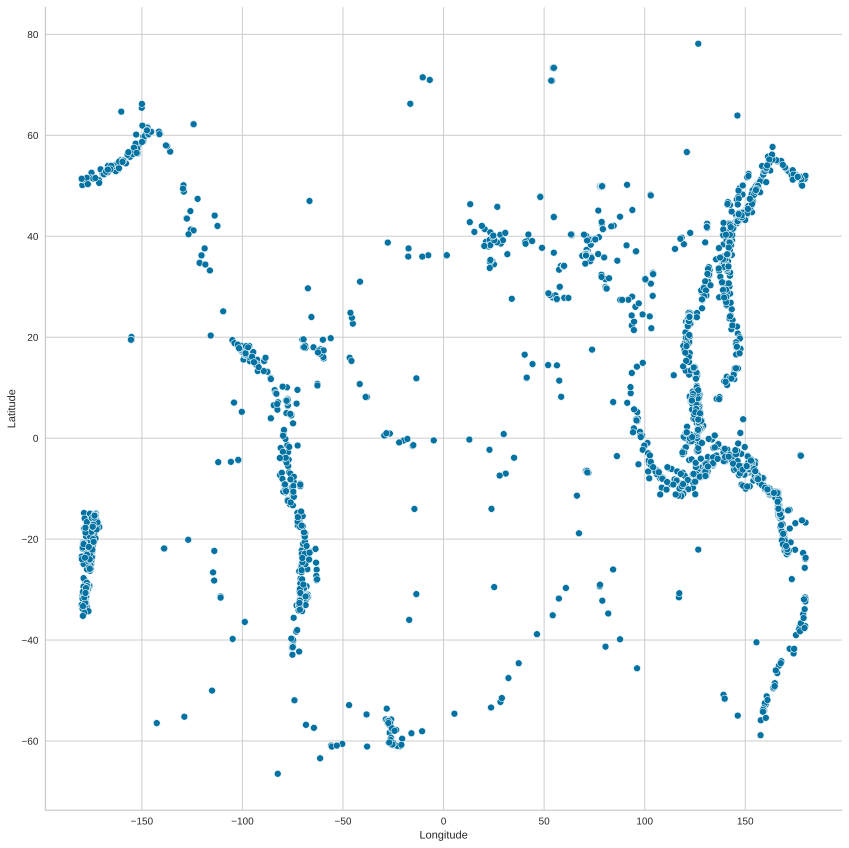

In [ ]:
sns.pairplot(x_vars="Longitude", y_vars="Latitude", data=data, height=12)

plt.show()

Let's add information about the depth of the epicenter to the graph.

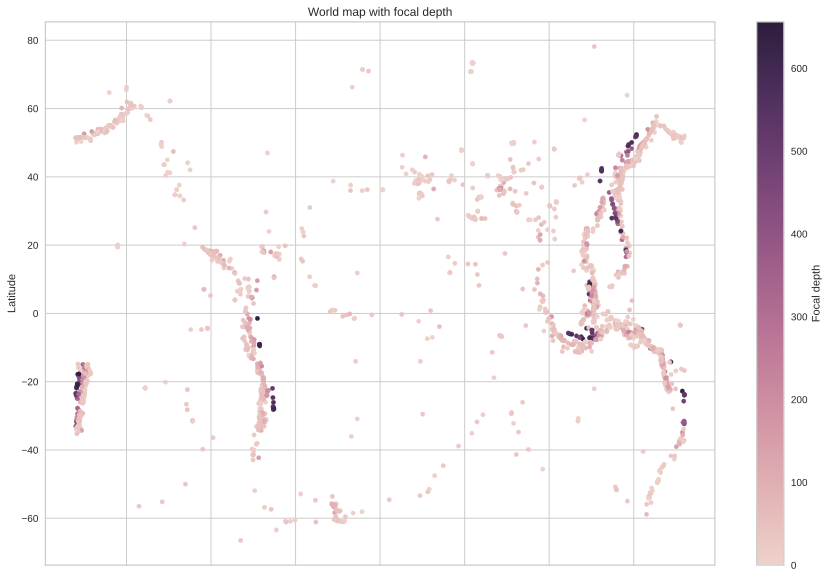

In [ ]:
cmap = sns.cubehelix_palette(as_cmap=True)

data.plot.scatter(x="Longitude", 
                        y="Latitude", 
                        c="Focal depth", 
                        figsize=(15, 10), 
                        cmap=cmap)
plt.title('World map with focal depth')
plt.show()

**Conclusion**  
* In general, the visualization did not give us much information. Nevertheless, it is possible to make assumptions or preferences about possible clustering. For example, I would like to see clusters of clusters in the left part of the graph as separate clusters.

Plot the magnitude of earthquakes and mean magnitude:

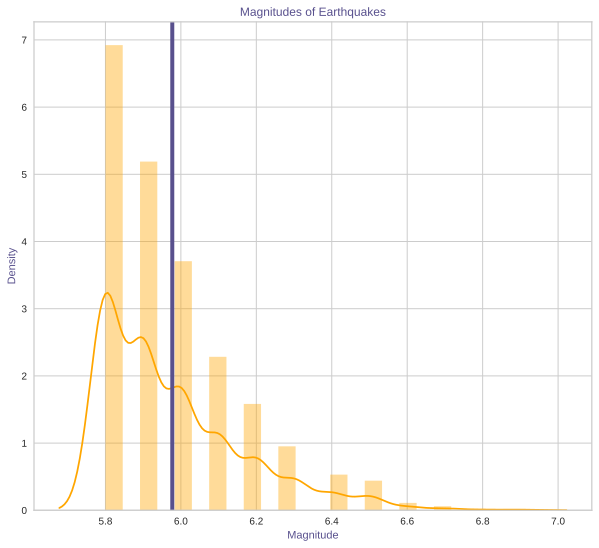

In [ ]:
plt.figure(figsize=(10,9))
strength = data["Richter"].values
mean_M= data["Richter"].mean()
Magnitude_plot = sns.distplot(strength, color ="#ffa600")
Magnitude_plot.set_title("Magnitudes of Earthquakes", color="#58508d")
Magnitude_plot.set_ylabel("Density", color="#58508d")
Magnitude_plot.set_xlabel("Magnitude", color="#58508d")

plt.axvline(mean_M,0,1, color="#58508d",linewidth=4,label="Mean")
plt.show()

* The average magnitude is 6.0.

**Geospatial Analysis**

Earth’s crust is divided into numerous segments called the tectonic plates. These plates are sometimes moved in little or huge amounts due to the geothermal energy generated in the Mantle of the Earth. These movements are mostly seen in the tectonic boundaries and are the major cause of natural Earthquakes.

* In this section, I will try to find any correlation between earthquakes and the tectonic plates. First, we shall plot the tectonic boundaries on the map, and see if these boundaries hold any relation with the location of earthquakes.

1) Tectonic plate boundaries plotted:  
* I found dataset with tectonic boundaries and their latitude and longitude.

In [ ]:
pl_df = pd.read_csv('/content/drive/My Drive/DA/HW8/all.csv', sep=',')
pl_df.head()

,plate,lat,lon
0,am,30.754,132.824
1,am,30.970,132.965
2,am,31.216,133.197
3,am,31.515,133.500
4,am,31.882,134.042


In [ ]:
tectonic = folium.Map(tiles="cartodbpositron", zoom_start=5)

plates = list(pl_df["plate"].unique())
for plate in plates:
    plate_vals = pl_df[pl_df["plate"] == plate]
    lats = plate_vals["lat"].values
    lons = plate_vals["lon"].values
    points = list(zip(lats, lons))
    indexes = [None] + [i + 1 for i, x in enumerate(points) if i < len(points) - 1 and abs(x[1] - points[i + 1][1]) > 300] + [None]
    for i in range(len(indexes) - 1):
        folium.vector_layers.PolyLine(points[indexes[i]:indexes[i+1]], popup=plate, color="#58508d", fill=False, ).add_to(tectonic)

tectonic

2) Plate boundaries with earthquake by magnitude (Richter):

As you can see from the map, there is a clear relationship between earthquakes and tectonic boundaries.  

The magnitude was divided into 3 ranges:  

Less than 5.9  
Less than 6.5  
More than 6.5  

In [ ]:
  Mag_tectonics  = folium.Map(tiles="cartodbpositron", zoom_start=5)

  gradient = {.33: "#628d82", .66: "#a3c5bf", 1: "#eafffd"} 

  plates = list(pl_df["plate"].unique())
  for plate in plates:
      plate_vals = pl_df[pl_df["plate"] == plate]
      lats = plate_vals["lat"].values
      lons = plate_vals["lon"].values
      points = list(zip(lats, lons))
      indexes = [None] + [i + 1 for i, x in enumerate(points) if i < len(points) - 1 and abs(x[1] - points[i + 1][1]) > 300] + [None]
      for i in range(len(indexes) - 1):
          folium.vector_layers.PolyLine(points[indexes[i]:indexes[i+1]], fill=False,  color="#58508d").add_to(Mag_tectonics)
          
  def colormag(val):
              if val < 5.9:
                  return "#ffcf6a"
              elif val < 6.5:
                  return "#fb8270"
              else:
                  return "#bc5090"
              
  for i in range(0,len(data)):
      folium.Circle(location=[data.iloc[i]["Latitude"], data.iloc[i]["Longitude"]],radius=2000, color=colormag(data.iloc[i]["Richter"])).add_to(Mag_tectonics)

In [ ]:
Mag_tectonics

Output hidden; open in https://colab.research.google.com to view.

There is no clear relation between Magnitude distribution and plate boundaries. It seems to be randomly distributed. We can easily discard any hypothesis we might’ve had regarding the correlation of tectonic boundaries and earthquake location. Next is the Depth.   

For Depth too, we shall choose 3 ranges:  

Less than 50Km  
Less than 100Km  
More than 100Km  

In [ ]:
Depth_tectonics  = folium.Map(tiles="cartodbpositron", zoom_start=5)

gradient = {.33: "#628d82", .66: "#a3c5bf", 1: "#eafffd"} 
plates = list(pl_df["plate"].unique())
for plate in plates:
    plate_vals = pl_df[pl_df["plate"] == plate]
    lats = plate_vals["lat"].values
    lons = plate_vals["lon"].values
    points = list(zip(lats, lons))
    indexes = [None] + [i + 1 for i, x in enumerate(points) if i < len(points) - 1 and abs(x[1] - points[i + 1][1]) > 300] + [None]
    for i in range(len(indexes) - 1):
        folium.vector_layers.PolyLine(points[indexes[i]:indexes[i+1]],fill=False,  color="#58508d").add_to(Depth_tectonics)
        
def colordepth(val):
            if val < 50:
                return "#ffcf6a"
            elif val < 100:
                return "#fb8270"
            else:
                return "#bc5090"
            
for i in range(0,len(data)):
    folium.Circle(location=[data.iloc[i]["Latitude"],
                            data.iloc[i]["Longitude"]],radius=2000, 
                            color=colordepth(data.iloc[i]["Focal depth"])).add_to(Depth_tectonics)

In [ ]:
Depth_tectonics

Output hidden; open in https://colab.research.google.com to view.

There seem to be some patterns here if you look closely. In places like South America, North America, Southeastern Asia, and in the tectonic boundaries near Oceania, the depth of the earthquake seems to be deeper, the further it is from a boundary. The closer they are the shallower the earthquakes. 

Making feature "is_land":

In [ ]:
# !pip install global_land_mask
# from global_land_mask import globe
# def get_land(lat,	lon):
#     if globe.is_land(lat,	lon):
#         return 1
#     else:
#         return 0

# data['is_land'] = data.apply(lambda x: get_land(x['Latitude'], x['Longitude']), axis=1)

# data.is_land.value_counts()

* Don't use it, explaine why in the end in General conclusion

## **Dropping duplicates**

Then I drop duplicates in Dataset.

In [ ]:
data.shape

(2178, 4)

In [ ]:
data.drop_duplicates(inplace=True)
data.shape

(2177, 4)

* 1 duplicate was found & deleted.

## **Distributions**

**Focal depth**

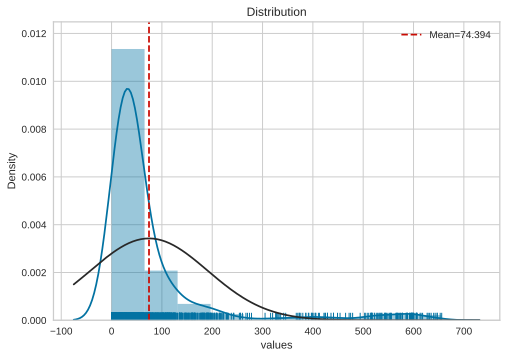

In [ ]:
draw_histogram(data['Focal depth'])

In [ ]:
count_skewness_kurtosis(data['Focal depth'])

Skewness: 3.275361
Kurtosis: 10.791681


* *Skewness* shows how symmetric the data is, from the value it is clear that the data is strongly biased.
* *Kurtosis* shows that the distribution is not flattened and has a long tail.
* Data looks like needed to be log transformed.

**Testing normality**

In [ ]:
shapiro_normality_testing(data['Focal depth'])

stat=0.550, p=0.000
Probably not Gaussian


**Conclusion:**  

* I'd say it looks more like a log-normal distribution, so it has many outliers.


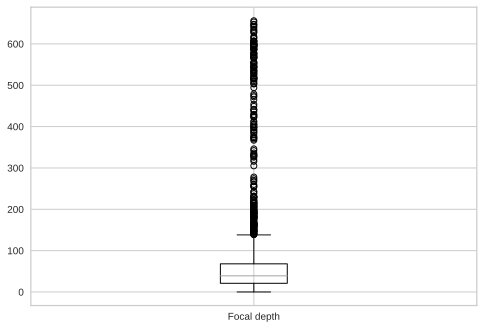

In [ ]:
data.boxplot(column=['Focal depth'])

**Conclusion** 
* This feature has a lot of outlaiers, near 150+.
* The median is around 74.

**Latitude**

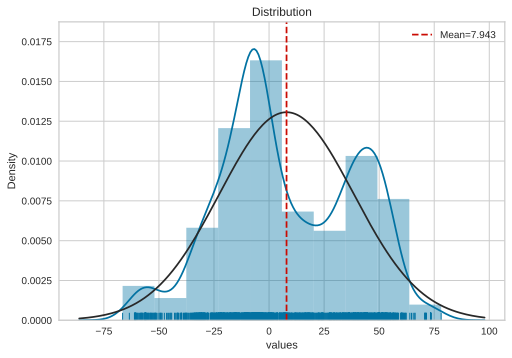

In [ ]:
draw_histogram(data['Latitude'])

In [ ]:
count_skewness_kurtosis(data['Latitude'])

Skewness: 0.046678
Kurtosis: -0.806792


* *Skewness* shows how symmetric the data is, from the value it is clear that the data is NOT biased.
* *Kurtosis* shows that the distribution is not flattened and has quit normal tails.


**Testing normality**

In [ ]:
shapiro_normality_testing(data['Latitude'])

stat=0.966, p=0.000
Probably not Gaussian


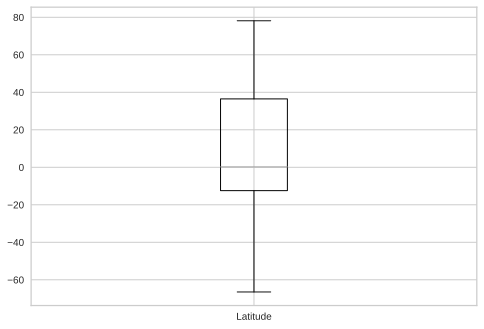

In [ ]:
data.boxplot(column=['Latitude'])
plt.show()

**Conclusion** 
* There are no outliers.
* The median is around 8.

**Longitude**

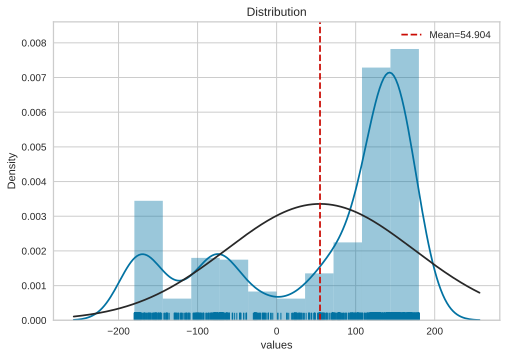

In [ ]:
draw_histogram(data['Longitude'])

In [ ]:
count_skewness_kurtosis(data['Longitude'])

Skewness: -0.857426
Kurtosis: -0.816544


* *Skewness* shows how symmetric the data is, from the value it is clear that the data is not strongly biased.
* *Kurtosis* shows that the distribution is not flattened.

**Testing normality**

In [ ]:
shapiro_normality_testing(data['Longitude'])

stat=0.811, p=0.000
Probably not Gaussian


**Conclusion:**  

* I'd say it looks more like a normal distribution, but I can try to apply log transformation.


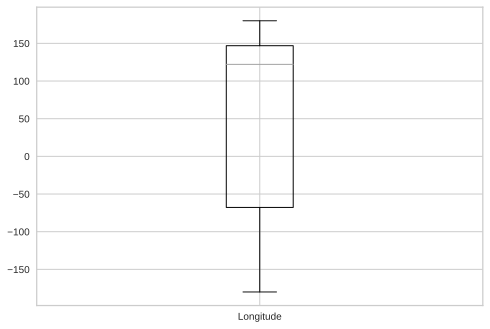

In [ ]:
data.boxplot(column=['Longitude'])
plt.show()

* See no outliers.
* Median is about 55.

**Richter**

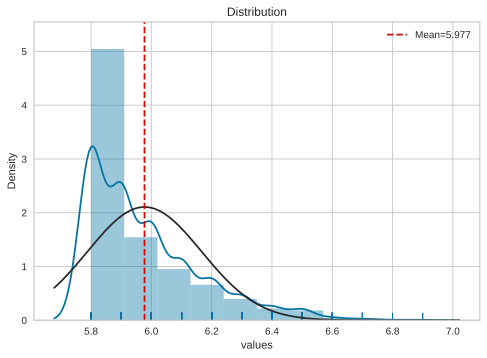

In [ ]:
draw_histogram(data['Richter'])

In [ ]:
count_skewness_kurtosis(data['Richter'])

Skewness: 1.297546
Kurtosis: 1.577676


* *Skewness* shows how symmetric the data is, from the value it is clear that the data is biased.
* *Kurtosis* shows that the distribution is not flattened and has a right tail.
* Data looks like needed to be log transformed.

**Testing normality**

In [ ]:
shapiro_normality_testing(data['Richter'])

stat=0.841, p=0.000
Probably not Gaussian


**Conclusion:**  

* I'd say it looks more like a log-normal distribution, so it has some outliers.


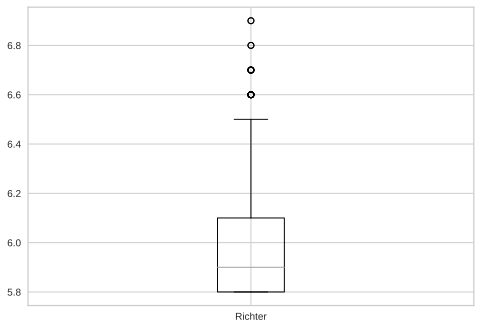

In [ ]:
data.boxplot(column=['Richter'])
plt.show()

**Conclusion** 
* This feature has a very small amount of outlaiers, near 6.6+.
* The median is around 6, and 2 after log transformation.

## **Correlation**

* Evaluation of the pairwise dependencies of numerical features.
* Calculation and visualization of the correlation matrix.

In [ ]:
corr_matrix = data.corr().round(4) 
corr_matrix

,Focal depth,Latitude,Longitude,Richter
Focal depth,1.0000,-0.1282,-0.0150,-0.0103
Latitude,-0.1282,1.0000,0.1352,0.0708
Longitude,-0.0150,0.1352,1.0000,-0.0200
Richter,-0.0103,0.0708,-0.0200,1.0000


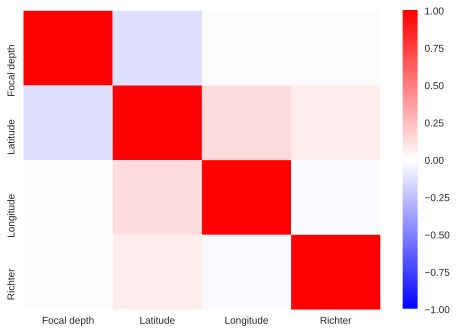

In [ ]:
sns.heatmap(corr_matrix, vmin=-1, vmax=1, cmap='bwr')

**Conclusion**:  
* It is important to understand that if the variables are strongly related to each other, then this can affect the training of the model in a bad way. The model will not adequately calculate the weights and parameters of the model. Therefore, it is better to remove such signs.

* At first glance, it is possible to see, that there is NO any strong correlation between features. 

* It can be concluded that multicollinearity doesn't take place in this dataset.

## **Outliers**

**IQR method**

In [ ]:
count_iqr(data)

Focal depth -> outliers: -> 14
Latitude -> outliers: -> 1


**Z-SCORE method**

In [ ]:
for col in data.columns:
    Zscore_outlier(data[col], col)

Focal depth:
Outliers amount: 90

Latitude:
Outliers amount: 0

Longitude:
Outliers amount: 0

Richter:
Outliers amount: 21



**Conclusion**
* Analyzing the emissions, in general, there are not very many of them.
* I can delete outlier values if it is due to data entry error, data processing error or outlier observations are very small in numbers. I can also use trimming at both ends to remove outliers. 
* But deleting the observation is not a good idea when we have small dataset.

* Transforming variables can also eliminate outliers. These transformed values reduces the variation caused by extreme values.


## **Removing the outliers**  


First, let's get rid of the noise. we're going to first set all outliers as NaN, so it will be taken care of in the next stage, where we impute the missing values.

In [ ]:
for column in data.columns:
    df = data[column]
    
    Q1 = df.quantile(0.25)
    Q3 = df.quantile(0.75)
    IQR = Q3 - Q1
    minimum = Q1 - (1.5 * IQR)
    maximum = Q3 + (1.5 * IQR)
 
    outliers = ((df < minimum) |(df > maximum))
    data[column].loc[outliers] = np.nan
    
data.isna().sum()

Focal depth    246
Latitude         0
Longitude        0
Richter         21
dtype: int64

## **Imputing the missing data**  


I use KNN imputer: Each sample’s missing values are imputed using the mean value from n_neighbors nearest neighbors found in the training set.

In [ ]:
from sklearn.impute import KNNImputer

In [ ]:
imputer = KNNImputer()
imp_data = pd.DataFrame(imputer.fit_transform(data), columns=data.columns)
imp_data.isna().sum()

Focal depth    0
Latitude       0
Longitude      0
Richter        0
dtype: int64

# **Standartisation**

* As a rule, the data contains various features, each of which can have its own scale of measurements. Let's look at the signs of earthquakes:
* Longitude is counted from -180 to 180. However,  on Earth, it will be the same measure. 

In [ ]:
new_df = imp_data.loc[:,'Longitude']

In [ ]:
cdf = new_df.copy(deep=True)

In [ ]:
cdf[long < 0] += 360
imp_data['Longitude'] = cdf
imp_data = imp_data[['Focal depth', 'Richter', 'Latitude', 'Longitude']]

* The depth of the epicenter is measured in kilometers and is represented in data from 0 to 6. (after log transform)
* Richter scale: from 1 to 2, although the data is presented in a narrower range. (after log transform)

**Reduction to the unit Euclidean norm**

In [ ]:
quake_normalized = pd.DataFrame(preprocessing.normalize(imp_data, norm="l2", axis=0), 
                                columns=imp_data.columns)
quake_normalized.head(10)

,Focal depth,Latitude,Longitude,Richter
0,0.013591,-0.035503,0.004632,0.021098
1,0.014827,0.030931,0.024704,0.020811
2,0.023476,0.028431,0.023370,0.020811
3,0.027595,0.019830,0.023103,0.022246
4,0.012356,-0.014715,0.027794,0.021529
5,0.000000,0.015686,0.019737,0.022246
6,0.032619,-0.014062,0.027812,0.021887
7,0.024712,0.015170,0.015317,0.021529
8,0.020593,-0.009266,0.027164,0.021529
9,0.049011,-0.011080,-0.011729,0.021529


# **Clustering of earthquakes**  


I'm building a pairplot to try to evaluate how the objects are distributed.

In [ ]:
sns.pairplot(quake_normalized, 
             plot_kws={'alpha':0.5}
            )
plt.show()

Output hidden; open in https://colab.research.google.com to view.

Visualization did not help much to identify the clusters:  
1) There are a lot of objects  
2) There is no clear division into clusters.  

## **KMeans**

### **K-Means with 15 clusters**

In [ ]:
Z_15 = KMeans(n_clusters = 15
           ,n_init = 1
           ,max_iter = 100 
           ,random_state=42
           )
Z_15.fit(quake_normalized)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=100,
       n_clusters=15, n_init=1, n_jobs=None, precompute_distances='auto',
       random_state=42, tol=0.0001, verbose=0)

In [ ]:
pd.Series(Z_15.labels_).value_counts()

0     314
11    277
1     268
9     202
10    175
4     134
3     125
6     124
7     110
2     108
8      84
13     73
12     65
5      59
14     59
dtype: int64

Сoordinates of cluster centers

In [ ]:
Z_15.cluster_centers_

array([[ 0.01053283, -0.00508925,  0.02327213,  0.02139635],
       [ 0.014258  ,  0.03010063,  0.02423231,  0.02141755],
       [ 0.0136966 , -0.01774062, -0.01166262,  0.02134461],
       [ 0.01113864,  0.03611506, -0.02520591,  0.02144543],
       [ 0.04328268, -0.00505139,  0.02354585,  0.02140282],
       [ 0.01708865, -0.0389081 , -0.00522682,  0.02129636],
       [ 0.01168683,  0.00733737, -0.01241115,  0.02151015],
       [ 0.01023507, -0.01588323, -0.02832746,  0.02146343],
       [ 0.03570719,  0.02526973,  0.01912833,  0.02157224],
       [ 0.01387965,  0.01463194,  0.01877483,  0.0214594 ],
       [ 0.00286418,  0.03265538,  0.00947706,  0.02148971],
       [ 0.02454144, -0.0029994 ,  0.02276238,  0.02136209],
       [ 0.0274881 , -0.01574013, -0.02898708,  0.02145029],
       [ 0.04059236, -0.01058886, -0.01245199,  0.02142349],
       [ 0.01175543, -0.0284205 ,  0.02391419,  0.0213219 ]])

The value of the objective function:  
* the sum of the squares of the distances from the object to the center of the cluster to
which it belongs.

In [ ]:
Z_15.inertia_

0.1884752592853491

**Visualization**

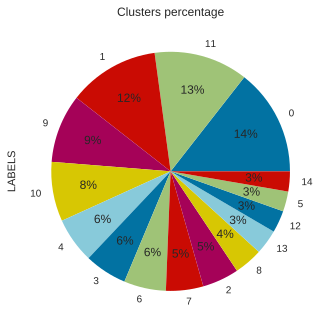

In [ ]:
draw_lbl_perc(Z_15, quake_normalized)

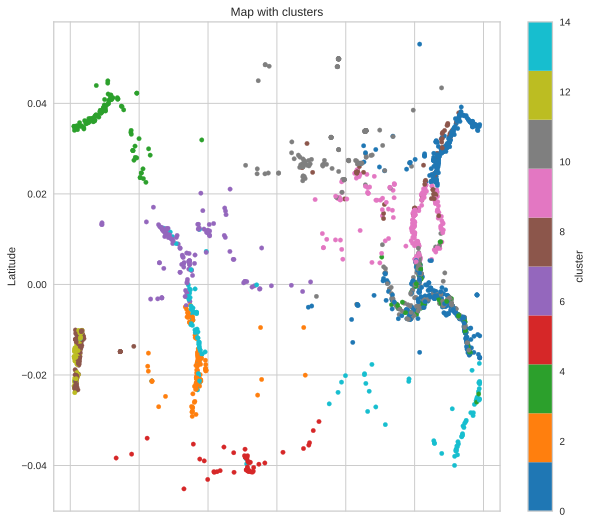

In [ ]:
draw_map_clusters(quake_normalized, Z_15, 'km')

**Conclusion**  

* Clustering turned out to be quite acceptable.
* At the bottom left, we managed to divide the site into 2 clusters (brown and light green) - this is quite an acceptable division, since looking at the world map by the strength of the earthquake, it is clear that this site can be divided into 2-3 clusters.
* Looking at the upper edge of the map on the right, you can see that there are about 5 clusters in one place (dark blue, pink, brown, green, gray) - this also correlates with the world map by the strength of the earthquake. But it would be possible to combine some clusters together, as the depth and strength of the earthquakes at pink and dark blue in the right part of the cluster map were approximately the same.

### **Choose optimal number of clusters for K-Means**

* I run the algorithm on a different number of clusters, then I use the elbow method to select the appropriate number of clusters.

In [ ]:
inertia = []
for k in range(1, 50):
    Z = KMeans(n_clusters=k, 
               n_init = 100,
               max_iter = 1000).fit(quake_normalized)
    inertia.append(Z.inertia_)

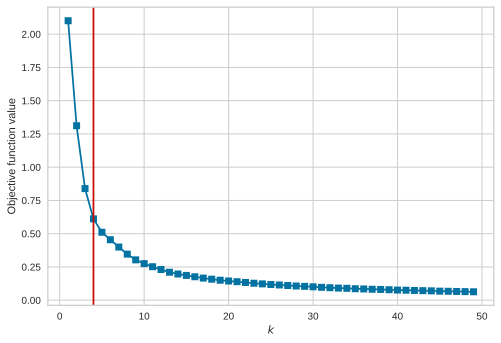

In [ ]:
plt.plot(range(1, 50), inertia, 'bo-', marker='s')
plt.xlabel('$k$')
plt.ylabel('Objective function value')
plt.axvline(x=4, c='r')
plt.show()

* I think that the most appropriate number of clusters will be 4.

In [ ]:
Z = KMeans(n_clusters = 4
           ,n_init = 1
           ,max_iter = 100 
           ,random_state=15434
          )
Z.fit(quake_normalized)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=100,
       n_clusters=4, n_init=1, n_jobs=None, precompute_distances='auto',
       random_state=15434, tol=0.0001, verbose=0)

In [ ]:
pd.Series(Z.labels_).value_counts()

2    842
0    664
1    440
3    231
dtype: int64

Coordinates of cluster centers

In [ ]:
Z.cluster_centers_

array([[ 0.01374989,  0.02724414,  0.01880916,  0.02146241],
       [ 0.01942027, -0.01782712, -0.01756805,  0.02140456],
       [ 0.02088717, -0.00516161,  0.02288768,  0.02138003],
       [ 0.01157698,  0.02517015, -0.0193194 ,  0.02150164]])

The value of the target function:

In [ ]:
Z.inertia_

0.6113117234813983

**Visualization**

Let's see how our data is distributed among these 4 clusters:

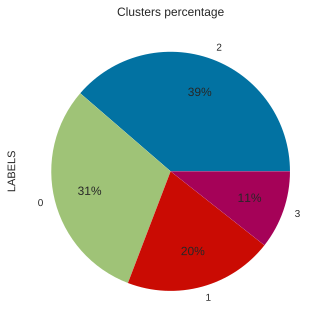

In [ ]:
draw_lbl_perc(Z, quake_normalized)

 See map with clusters

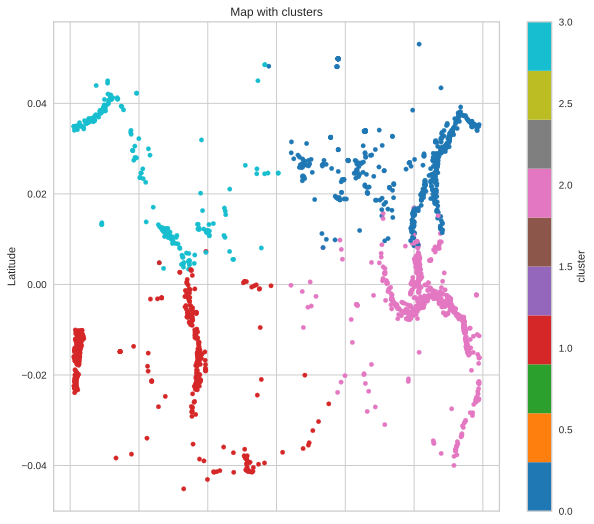

In [ ]:
draw_map_clusters(quake_normalized, Z, 'km')

**Conclusion**:
* After applying the "elbow method", the division into 4 clusters was chosen.
* If you look at the depth of earthquakes on the world map, then you need to divide into a larger number of clusters. However, the pink cluster quite successfully identifies the locations of some places where the depth of the earthquake was extremely high. However, this could not be done from the left side.
*This division is more like a geographical division by continents.

## **Hierarchical clustering**

I count correlations for accurate estimation of distances between objects.

In [ ]:
d = {'euclidean': pdist(quake_normalized, 'euclidean'),
     'cityblock': pdist(quake_normalized, 'cityblock'),
     'minkowski_6': pdist(quake_normalized, 'minkowski', p=6),
     'cosine': pdist(quake_normalized, 'cosine'),
     'chebyshev': pdist(quake_normalized, 'chebyshev'),
     'canberra': pdist(quake_normalized, 'canberra')}

D = pd.DataFrame(d)
D.shape

(2368576, 6)

In [ ]:
D_corr = D.corr().loc[['cityblock', 'euclidean', 'minkowski_6', 'chebyshev', 'canberra', 'cosine'],
                      ['cityblock', 'euclidean', 'minkowski_6', 'chebyshev', 'canberra', 'cosine']
                     ]
D_corr

,cityblock,euclidean,minkowski_6,chebyshev,canberra,cosine
cityblock,1.000000,0.971829,0.900292,0.875517,0.828166,0.892272
euclidean,0.971829,1.000000,0.974744,0.958938,0.765374,0.916882
minkowski_6,0.900292,0.974744,1.000000,0.997312,0.685077,0.892841
chebyshev,0.875517,0.958938,0.997312,1.000000,0.663981,0.878269
canberra,0.828166,0.765374,0.685077,0.663981,1.000000,0.788879
cosine,0.892272,0.916882,0.892841,0.878269,0.788879,1.000000


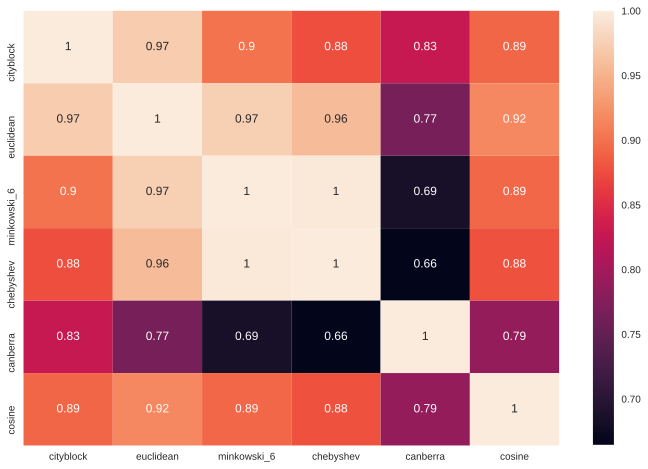

In [ ]:
plt.figure(figsize=(12, 8))
sns.heatmap(D_corr, annot=True)
plt.show()

* The cosine distance and canberra are very different from the others, they will not participate in clustering, the other distances in the data turned out to be more similar and should give approximately the same results.

Since there are too many objects, the dendrogram will be poorly readable. To evaluate the dynamics of changes in distances on the dendrogram, in this case, you can build a graph. The threshold can be selected using the elbow method: select the point at which the graph decline slows down the most - the "elbow bend".  

### **!!!** 
It can be seen from the correlation matrix that the distances of Minkowski, Chebyshev and Manhattan blocks are best correlated with Euclidean, so I will consider the Euclidean one, because they will have practically the same results. 

### **Euclidean distance**


### **a) Distance of the far neighbor (complete).**

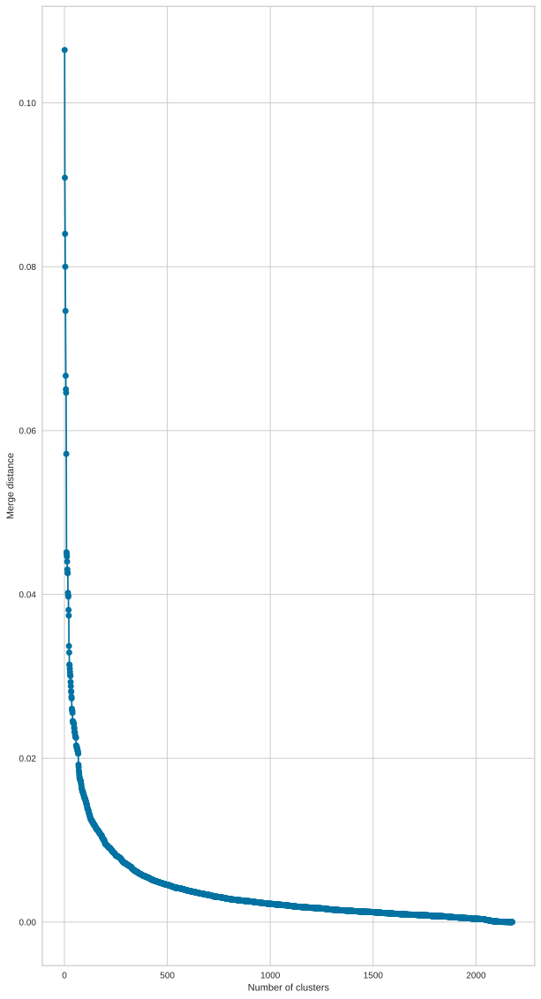

In [ ]:
Z1 = linkage(quake_normalized, method="complete",  metric='euclidean')
plot_elbow(Z1, w = 20)

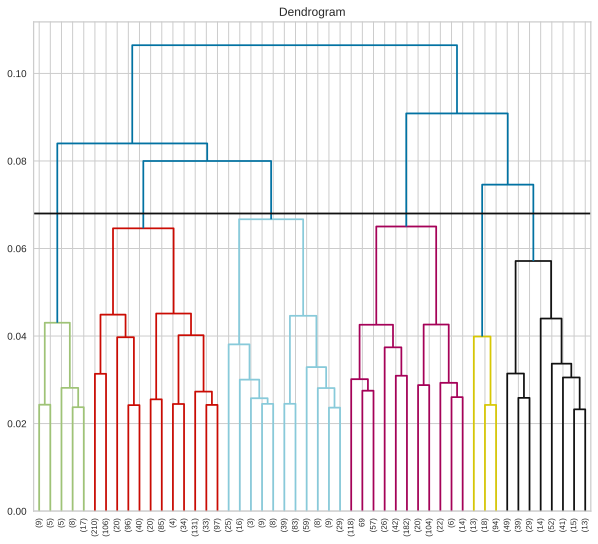

In [ ]:
draw_dendrogram(Z1, 50, 0.068)

Let's see final split:

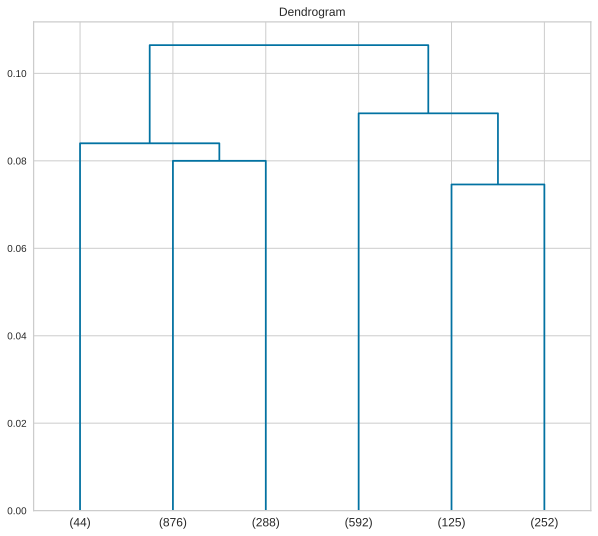

In [ ]:
draw_dendrogram(Z1, 6, 0)

In [ ]:
fcluster(Z1, t = 6, criterion='maxclust')

array([3, 4, 4, ..., 4, 4, 2], dtype=int32)

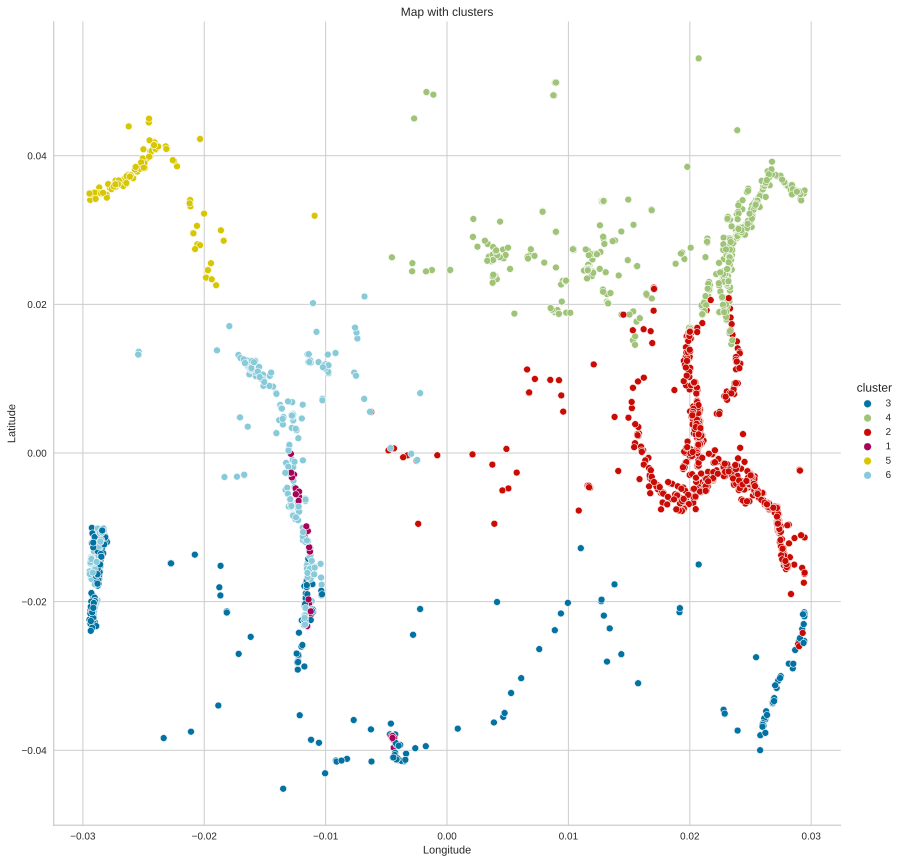

In [ ]:
draw_map_clusters(quake_normalized, Z1, 'agl', t=6)

**Conclusion**  
* For the Euclidean distance between objects and the distance of the far neighbor between clusters, I considered it possible to allocate 6 clusters, since the distances within the clusters are not very large.
* Looking at the map, you can see that the depth of the earthquakes is well distinguished by two clusters in the lower left corner and in the middle (blue, purple, blue clusters).
* The remaining clusters are most likely split more along geographical lines.

### **b) The distance of the nearest neighbor (Single)**

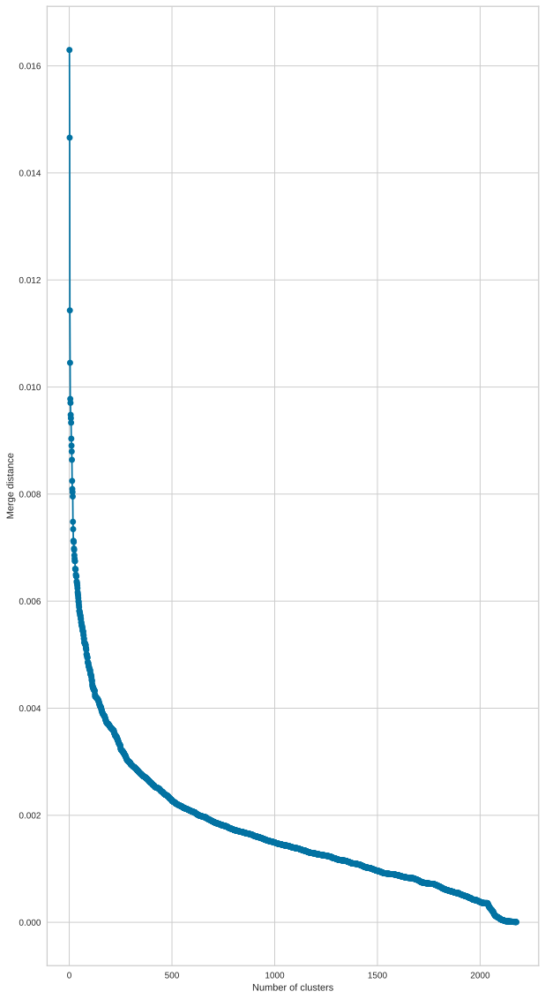

In [ ]:
Z2 = linkage(quake_normalized, method="single",  metric='euclidean')
plot_elbow(Z2, w = 20)

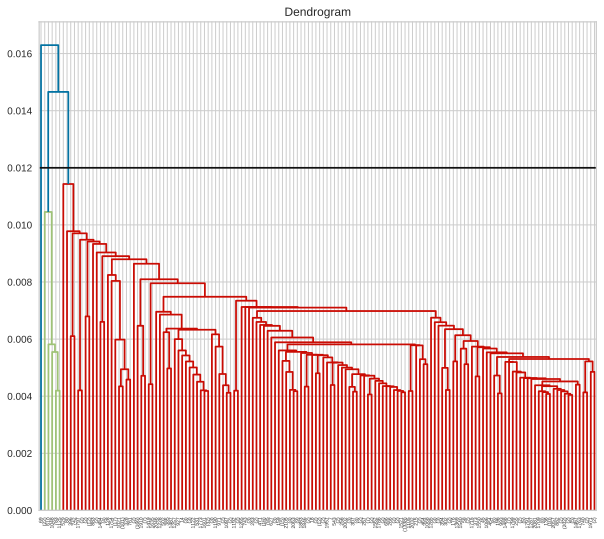

In [ ]:
draw_dendrogram(Z2, 150, 0.012)

Let's see final split:

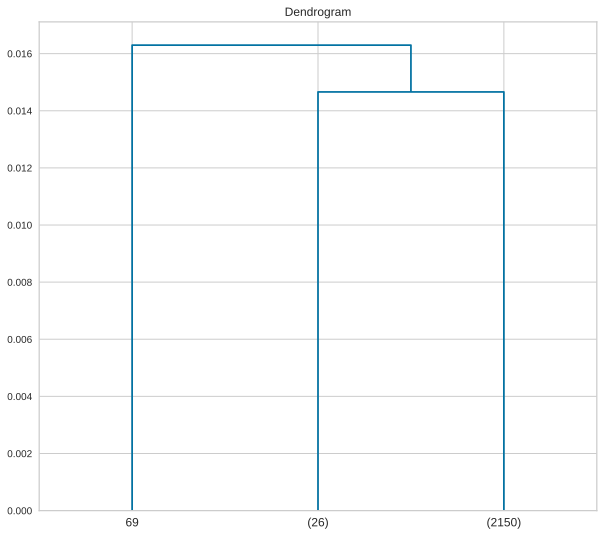

In [ ]:
draw_dendrogram(Z2, 3, 0)

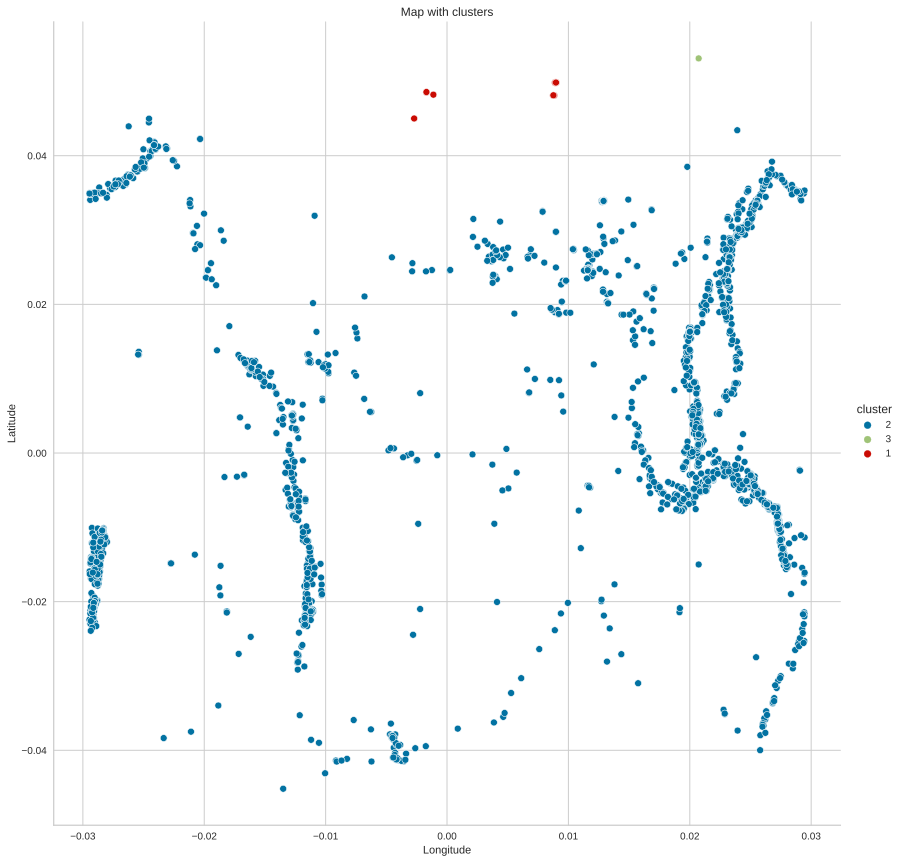

In [ ]:
draw_map_clusters(quake_normalized, Z2, 'agl', t=3)

**Conclusion**
* For the Euclidean distance between objects and the distance of the nearest neighbor between clusters, it is difficult to distinguish adequately separated clusters, this distance is not suitable for this task.

### **c) The average distance (average)**

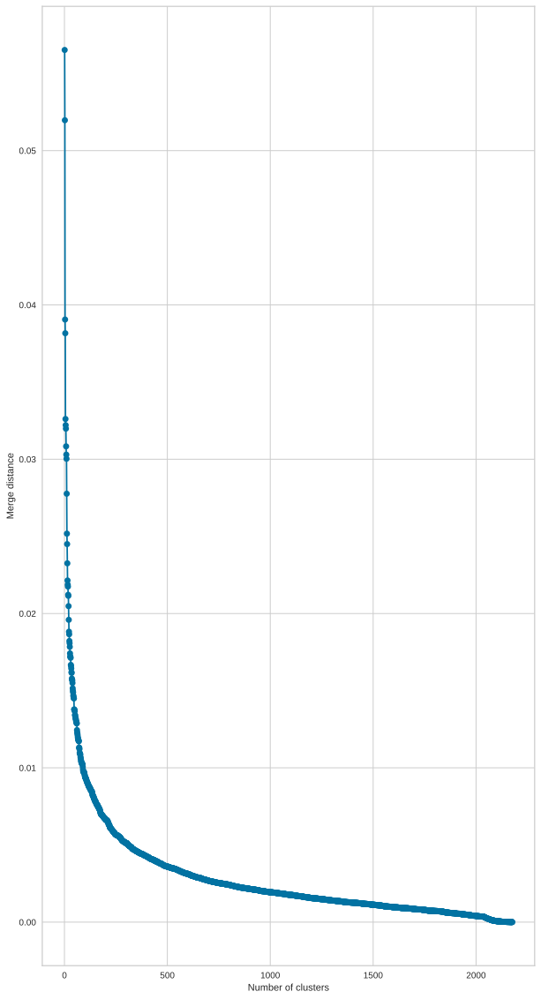

In [ ]:
Z3 = linkage(quake_normalized, method="average",  metric='euclidean')
plot_elbow(Z3, w = 20)

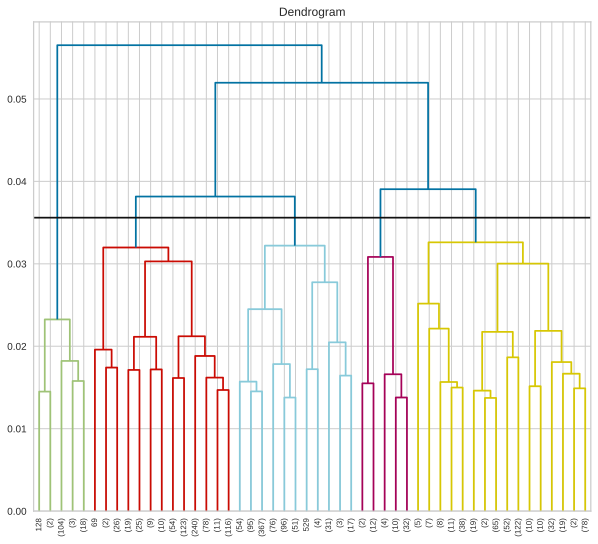

In [ ]:
draw_dendrogram(Z3, 50, 0.0356)

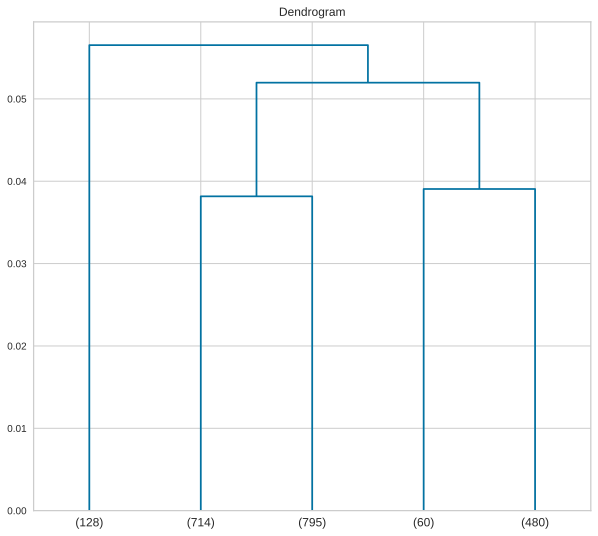

In [ ]:
draw_dendrogram(Z3, 5, 0)

See map with clusters:

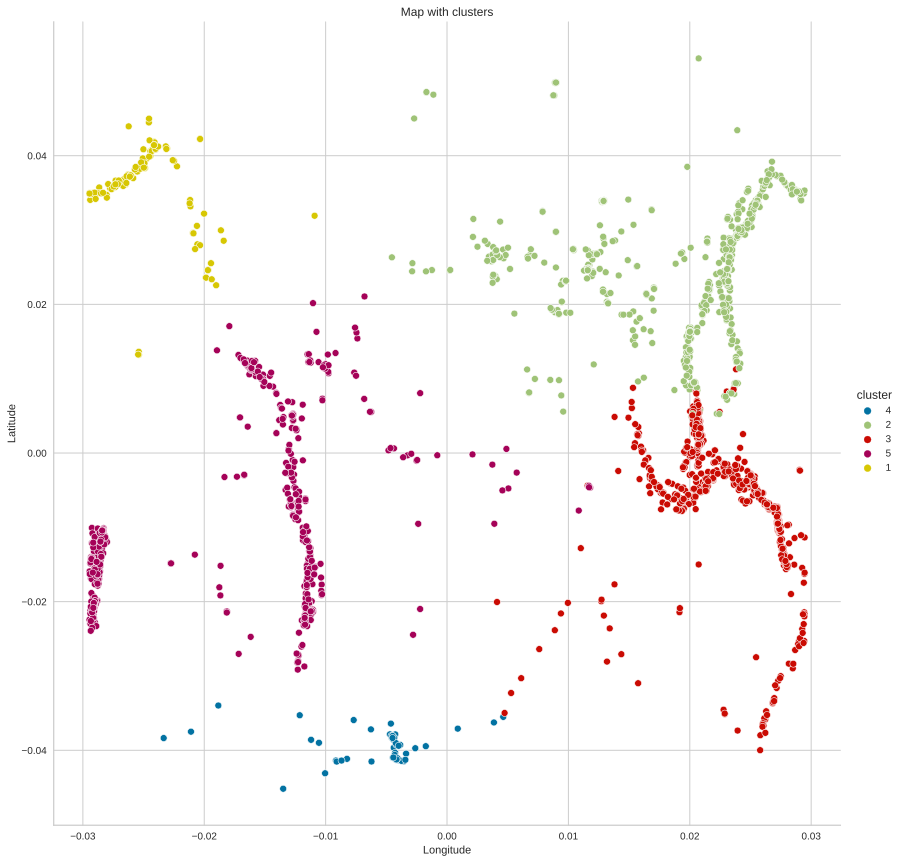

In [ ]:
draw_map_clusters(quake_normalized, Z3, 'agl', t=5)

In [ ]:
fcluster(Z3, t = 5, criterion='maxclust')

array([4, 2, 2, ..., 2, 2, 2], dtype=int32)

**Conclusion**
* For the Euclidean distance between objects and the average distance between clusters, I considered it possible to allocate 5 clusters, since the distances within the clusters are not very large.
* The split is unsuccessful due to the selected metrics, since the split is rather geographical and does not find a complex structure based on the depth of earthquakes.

### **d) Centroid distance (centroid)**

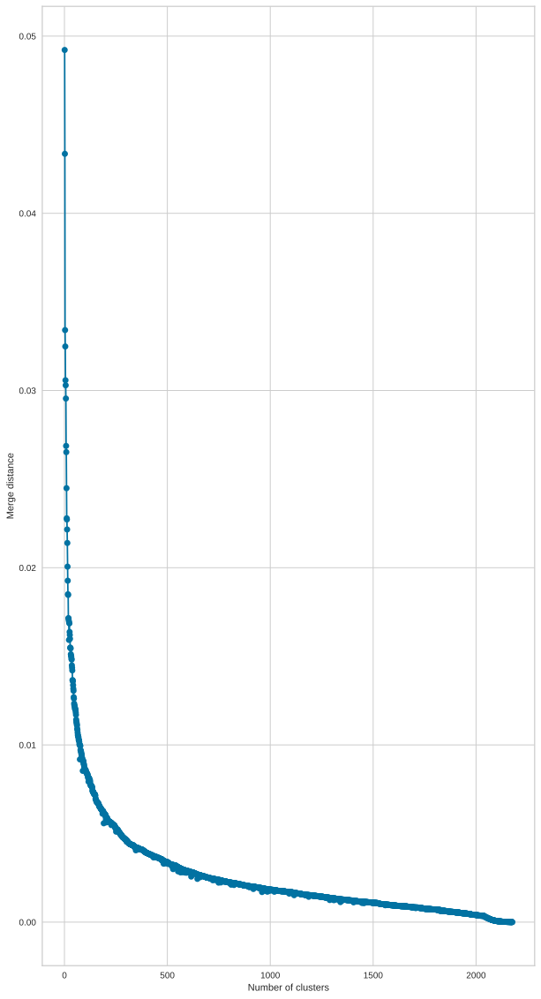

In [ ]:
Z4 = linkage(quake_normalized, method="centroid",  metric='euclidean')
plot_elbow(Z4, w = 20)

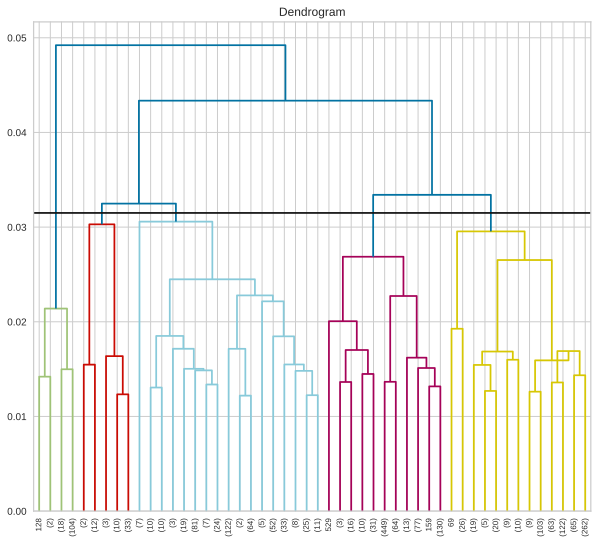

In [ ]:
draw_dendrogram(Z4, 50, 0.0315)

Let's see final split:

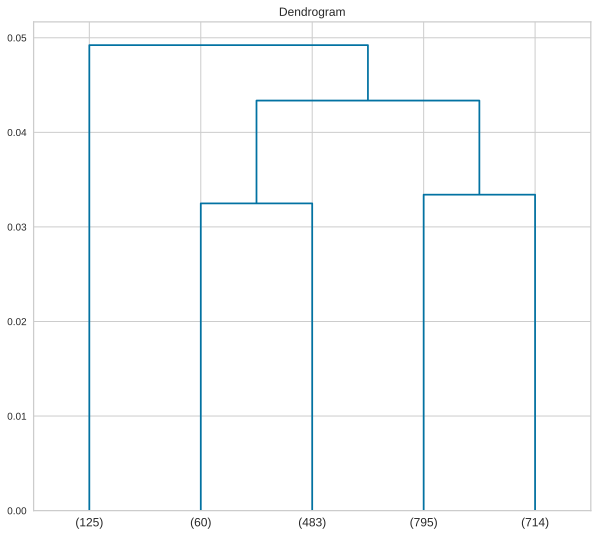

In [ ]:
draw_dendrogram(Z4, 5, 0)

In [ ]:
fcluster(Z4, t = 5, criterion='maxclust')

array([2, 5, 5, ..., 5, 5, 5], dtype=int32)

See map with clusters:

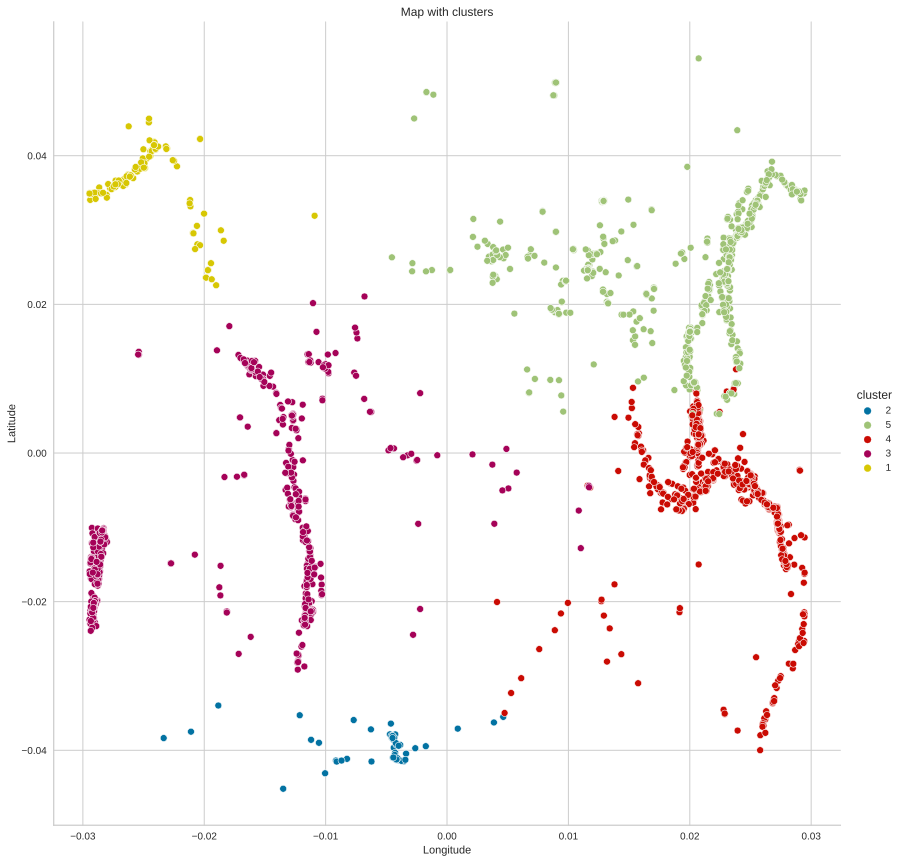

In [ ]:
draw_map_clusters(quake_normalized, Z4, 'agl', t=5)

**Conclusion**
* For the Euclidean distance between objects and the average distance between clusters, I considered it possible to allocate 5 clusters, since the distances within the clusters are not very large.
* The split is unsuccessful due to the selected metrics, since the split is rather geographical and does not find a complex structure based on the depth of earthquakes.

### **e) Median distance (median)**

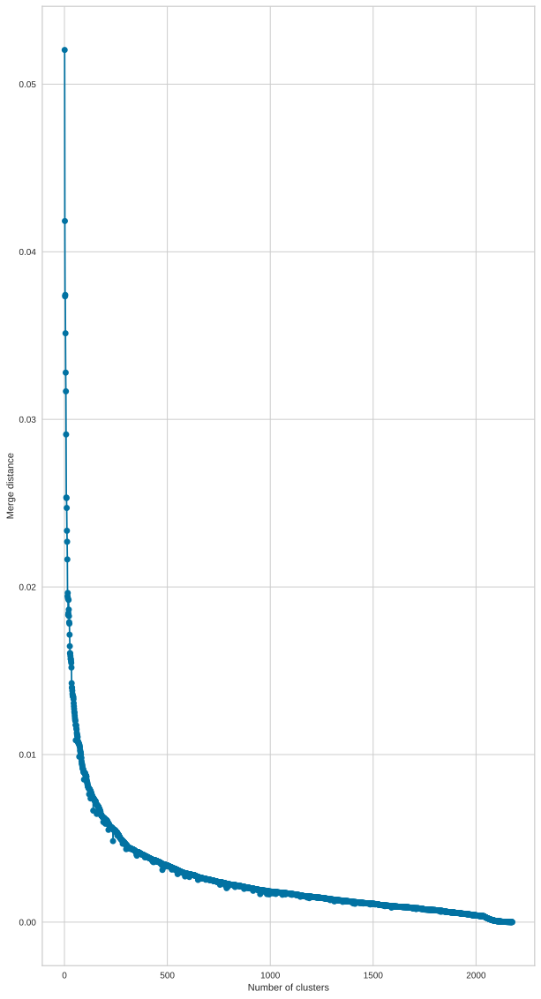

In [ ]:
Z5 = linkage(quake_normalized, method="median",  metric='euclidean')
plot_elbow(Z5, w = 20)

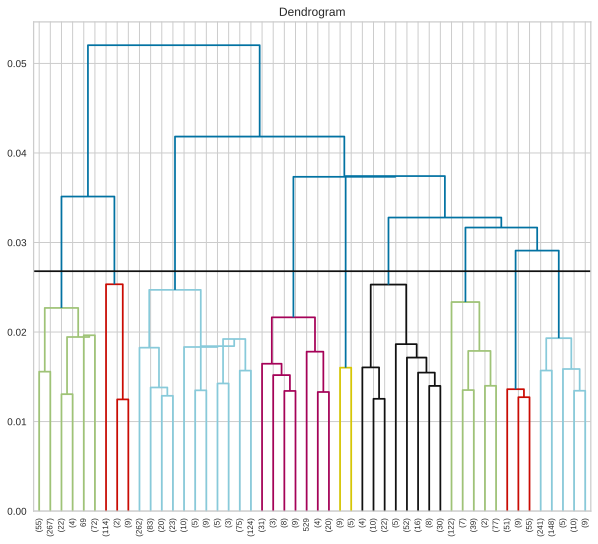

In [ ]:
draw_dendrogram(Z5, 50, 0.0268)

Let's see final split:

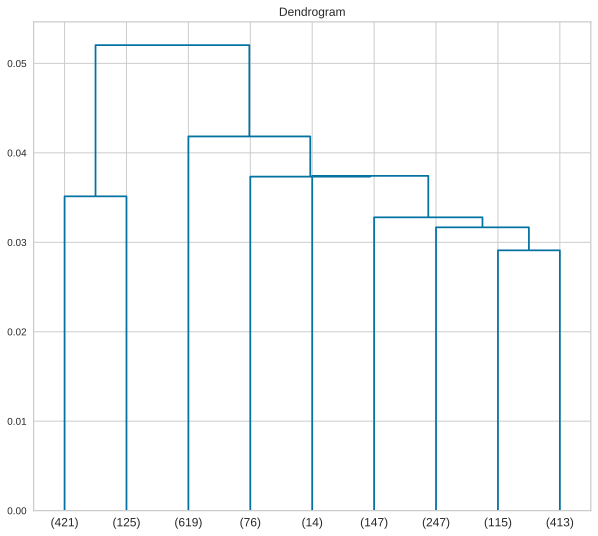

In [ ]:
draw_dendrogram(Z5, 9, 0)

In [ ]:
fcluster(Z5, t = 9, criterion='maxclust')

array([7, 3, 3, ..., 3, 1, 1], dtype=int32)

See map with clusters:

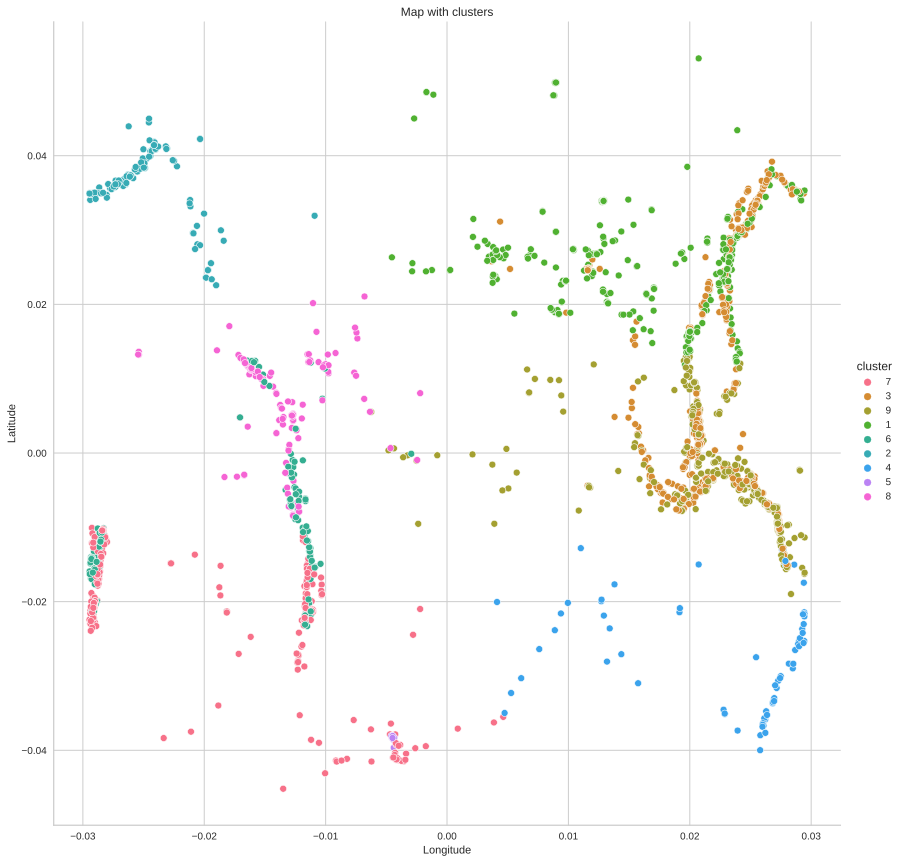

In [ ]:
draw_map_clusters(quake_normalized, Z5, 'agl', t=9)

**Conclusion**

* For the Euclidean distance between objects and the median distance between clusters, I considered it possible to allocate 9 clusters, since the distances within the clusters are not very large.
* For a couple of parts on the map - this division is quite suitable, but of course the structure of clusters in terms of earthquake depth is extremely heavy and there are some "merged" clusters.

### **f) The Ward method**

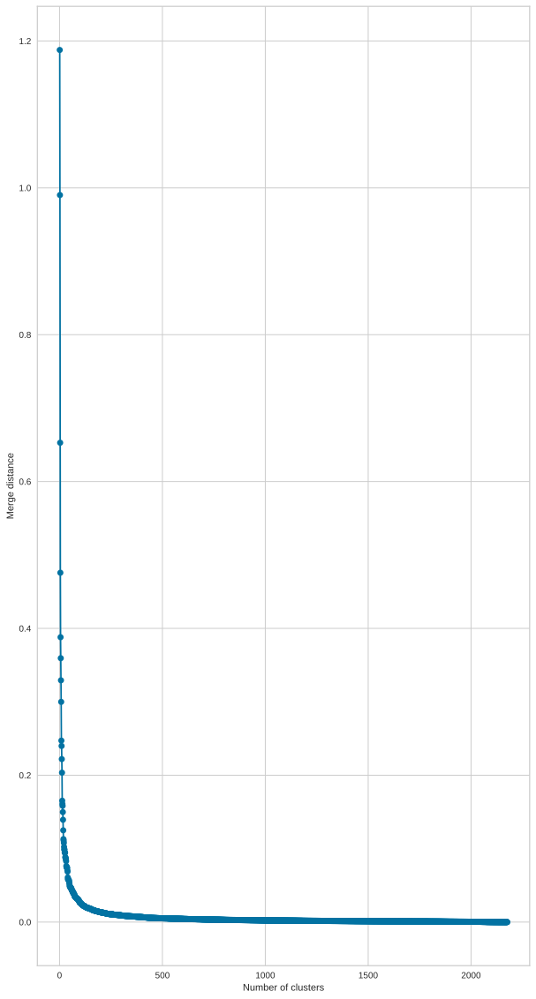

In [ ]:
Z6 = linkage(quake_normalized, method="ward",  metric='euclidean')
plot_elbow(Z6, w = 20)

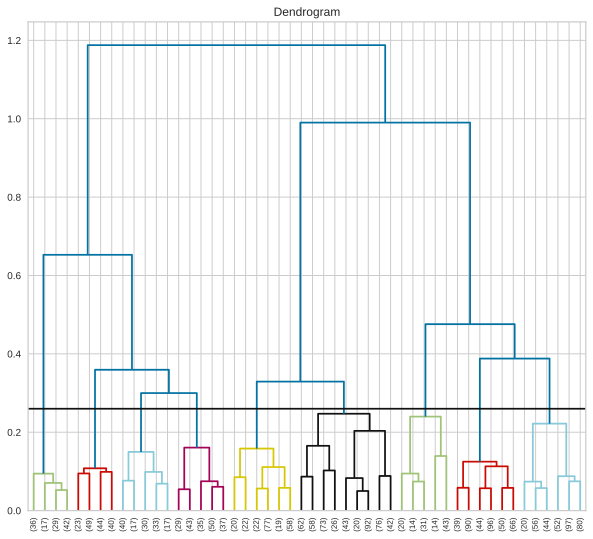

In [ ]:
draw_dendrogram(Z6, 50, 0.26)

Let's look at the final dendrogram.

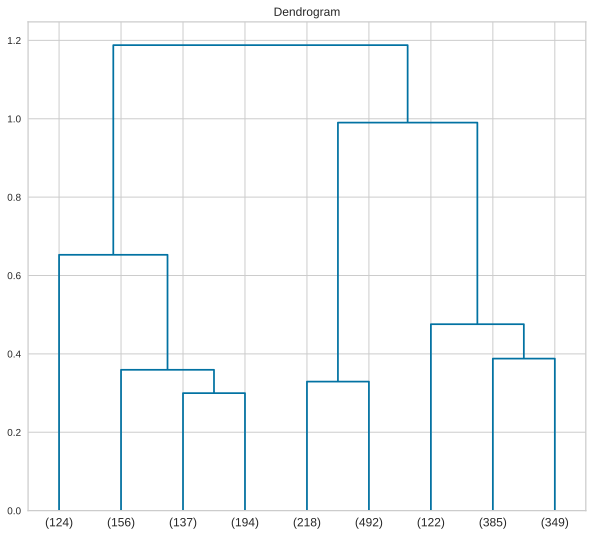

In [ ]:
draw_dendrogram(Z6, 9, 0)

In [ ]:
fcluster(Z6, t = 9, criterion='maxclust')

array([7, 6, 5, ..., 5, 5, 5], dtype=int32)

See map with clusters:

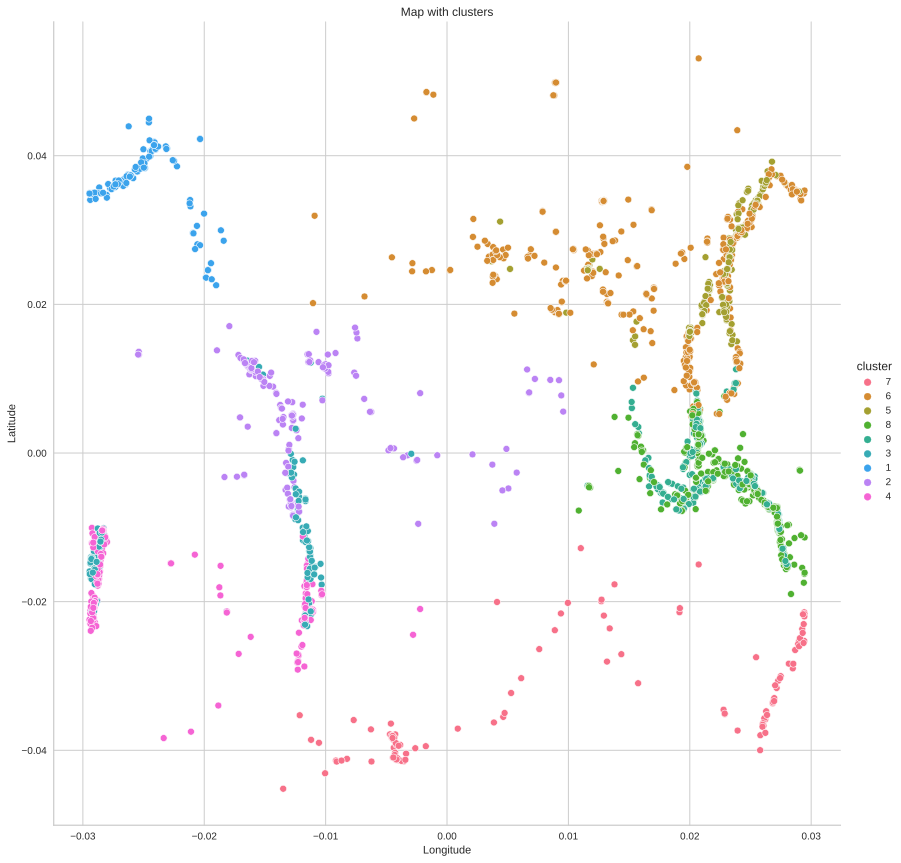

In [ ]:
draw_map_clusters(quake_normalized, Z6, 'agl', t=9)

**Conclusion**
* In principle, the Ward method more or less copes with the task and it was decided to allocate 9 clusters.
* According to the distribution of data on the depth of earthquakes, it was possible to identify the main trends.


### **Comparison of partitions**

To compare partitions in pairs, I use the conjugacy matrix.

In [ ]:
# 9 clusters
hc_median = fcluster(linkage(quake_normalized, method='median'),
                       t=9
                       ,criterion='maxclust'
                      )

hc_ward= fcluster(linkage(quake_normalized, method='ward'),
                       t=9,
                       criterion='maxclust'
                      )

In [ ]:
pd.crosstab(hc_median, hc_ward, rownames=['hc_median'], colnames=['hc_ward'])

hc_ward,1,2,3,4,5,6,7,8,9
hc_median,,,,,,,,,
1,0,0,0,0,41,380,0,0,0
2,124,0,0,0,0,1,0,0,0
3,0,0,0,0,177,55,0,40,347
4,0,0,0,0,0,0,65,9,2
5,0,0,0,0,0,0,14,0,0
6,0,20,127,0,0,0,0,0,0
7,0,0,10,194,0,0,43,0,0
8,0,113,0,0,0,2,0,0,0
9,0,23,0,0,0,54,0,336,0


In [ ]:
# 5 clusters
hc_average = fcluster(linkage(quake_normalized, method='average'),
                       t=5
                       ,criterion='maxclust'
                      )

hc_centroid= fcluster(linkage(quake_normalized, method='centroid'),
                       t=5,
                       criterion='maxclust'
                      )

In [ ]:
pd.crosstab(hc_average, hc_centroid, rownames=['hc_average'], colnames=['hc_single'])

hc_single,1,2,3,4,5
hc_average,,,,,
1,125,0,3,0,0
2,0,0,0,0,714
3,0,0,1,794,0
4,0,60,0,0,0
5,0,0,479,1,0


* It can be seen that for the distances of the median and ward and average, single do not coincide.

### **Conclusion (Euclidean distance):**

* It is worth noting that the clusters obtained by the Ward, complete and median method turned out to be more or less successful and finds some structure in relation to the depth of the earthquake. When visualizing, you can see some clusters, the splitting at first glance turned out quite good.
* Using the remaining distances, they show more division by geographical feature.
* The Single distance coped the worst of all.
* In general, hierarchical clustering has shown a good result, especially with **Euclidean distance and the Ward method**, I consider the other partitions more unsuccessful.

## **DBSCAN**

**Heuristics for selecting parameters**

**MinPts**  
* There is no automatic way to determine the minPts value for DBSCAN. Ultimately, the value of minPts should be set taking into account the knowledge of the subject area and the knowledge of the data set. 

**Epsilon (ε)**  
* It is possible to implement a method for automatically determining the optimal value of ε. This method calculates the average distance between each point and its nearest neighbors k, where k = the selected minPts value. Then the average k-distances are plotted in ascending order on the k-distance graph. The optimal value for ε will be at the point of maximum curvature (i.e., where the graph has the greatest slope).

* To calculate the average distance between each point and its *n_neighbors*, I used the *NearestNeighbors* from Scikit-learn.
* The parameter that we define ourselves is *n_neighbors*, which in this case is the value that we choose for *minPts*.

In [ ]:
neighbors = NearestNeighbors(n_neighbors=10)
neighbors_fit = neighbors.fit(quake_normalized)
distances, indices = neighbors_fit.kneighbors(quake_normalized)

* For a given data set, sorted distances give a graph of the local distance k:

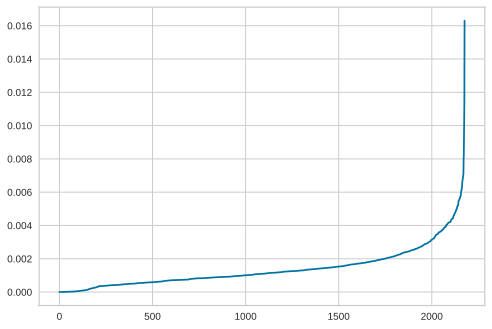

In [ ]:
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)
plt.show()

* The best value for **ε** will be equal to the value of the distance at the "bend of the elbow" or the point of maximum curvature.
* *Eps* can be selected from **0.003** up to **0.0056**

### **1) Euclidean distance**

In [ ]:
cl_dbscan_euc = DBSCAN(eps= 0.004, min_samples=10, metric='euclidean')

cl_dbscan_euc.fit(quake_normalized)
pd.Series(cl_dbscan_euc.labels_).value_counts()

 0     1081
-1      470
 5      147
 2       98
 6       61
 7       56
 3       49
 11      22
 12      20
 8       19
 10      19
 1       16
 4       15
 20      15
 9       14
 16      13
 14      12
 15      12
 18      11
 13      10
 19      10
 17       7
dtype: int64

**Visualization**

* Let's look at how the objects were distributed into root, border, and outliers. It can be seen that almost all the objects turned out to be root, i.e. the density of objects is quite high with the selected parameters.

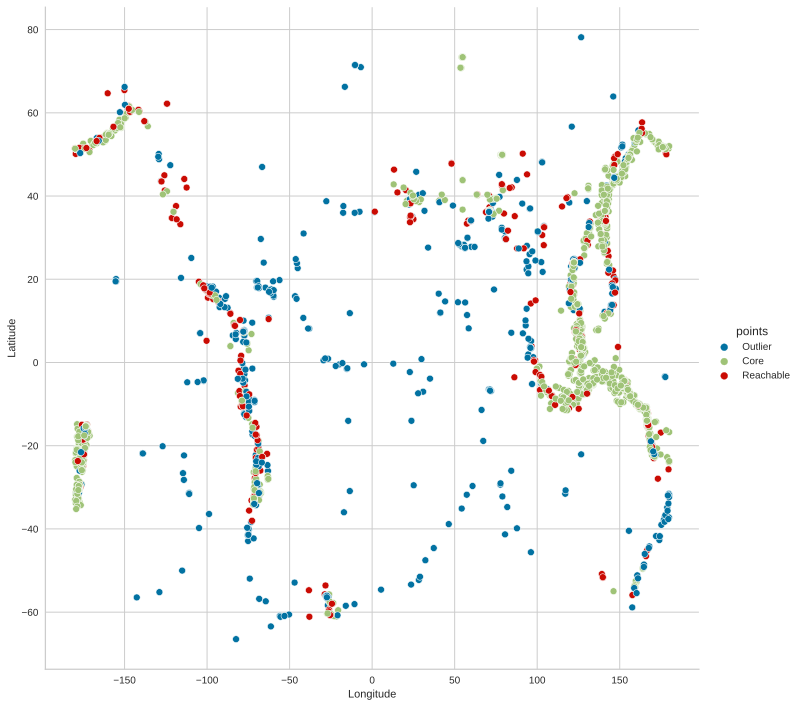

In [ ]:
draw_DBSCAN_points(data, cl_dbscan_euc)

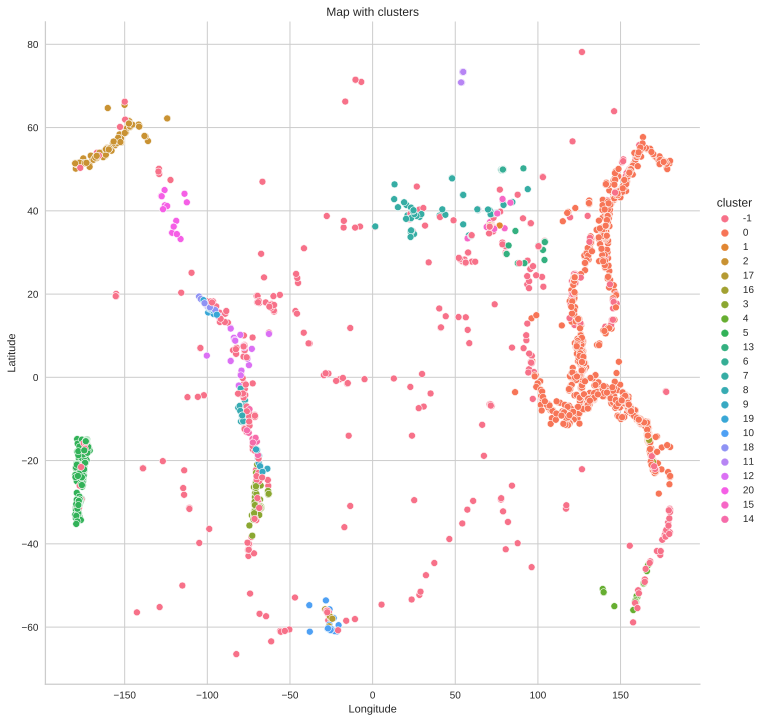

In [ ]:
draw_map_clusters(data, cl_dbscan_euc, 'db')

**Conclusion**  
* Looking at the clustering results, we got 21 clusters, some of them are very small, and there are a lot of outliers. In general, some clusters look reasonable, from the top left and bottom left, since there are large and small earthquakes in these places. A couple of clusters in the middle and on the right also got a good separation, but I note once again that this algorithm has allocated too many small clusters. The cluster of objects on the left is divided into several clusters due to the strong dispersion in the depth of the epicenter.

### **2) The distance of Manhattan blocks**

In [ ]:
cl_dbscan_cb = DBSCAN(eps=0.0056, min_samples=10, metric='cityblock')
cl_dbscan_cb.fit(quake_normalized)
pd.Series(cl_dbscan_cb.labels_).value_counts()

 0     1058
-1      577
 5      148
 2       93
 6       61
 3       46
 7       27
 8       25
 9       22
 10      22
 1       16
 13      14
 14      14
 4       14
 15      10
 12      10
 11      10
 16      10
dtype: int64

**Visualization**

* Let's look at how the objects were distributed into root, border, and outliers. It can be seen that almost all the objects turned out to be root, i.e. the density of objects is quite high with the selected parameters.


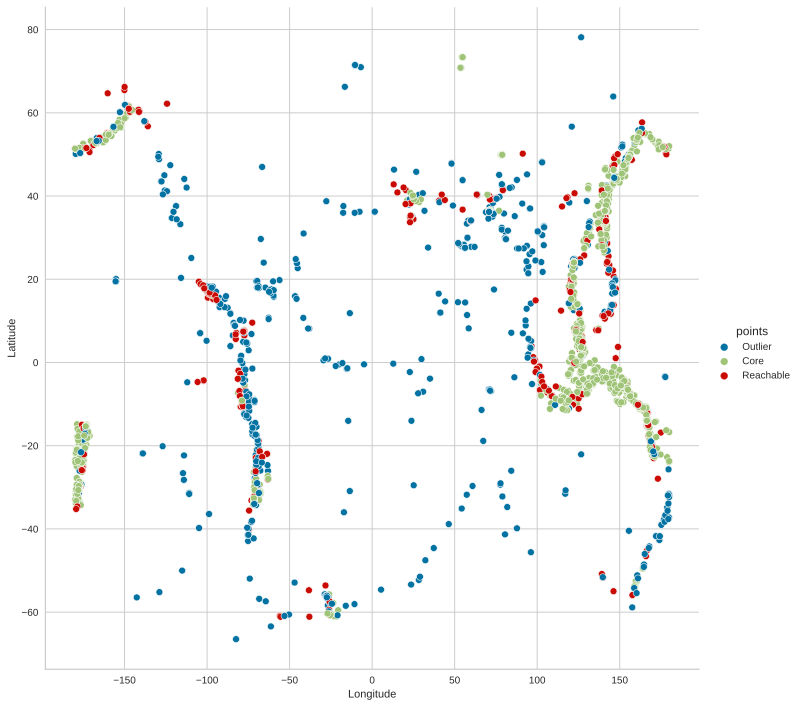

In [ ]:
draw_DBSCAN_points(data, cl_dbscan_cb)

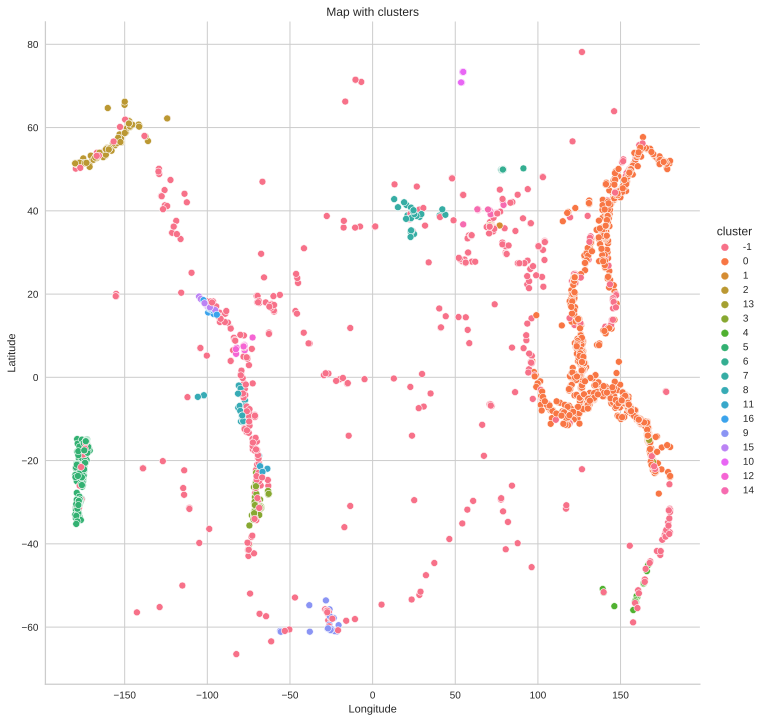

In [ ]:
draw_map_clusters(data, cl_dbscan_cb, 'db')

**Conclusion:**

* For the Distance of Manhattan blocks between objects, the algorithm managed to allocate 17 clusters and a lot of outliers.
* The split is extremely similar to the previous ones, the conclusions remain the same, the only thing is that there are a little less very small clusters, which in some moments is better for this dataset.

### **3) Minkowski distance**

In [ ]:
cl_dbscan_mink = DBSCAN(eps=0.0056, min_samples=10, metric='minkowski', p=5)

cl_dbscan_mink.fit(quake_normalized)
pd.Series(cl_dbscan_mink.labels_).value_counts()

 0    1384
 5     248
 7     173
-1     141
 2     121
 4      34
 6      28
 8      22
 1      16
 3      10
dtype: int64

**Visualization**

* Let's look at how the objects were distributed into root, border, and outliers. It can be seen that almost all the objects turned out to be root, i.e. the density of objects is quite high with the selected parameters.


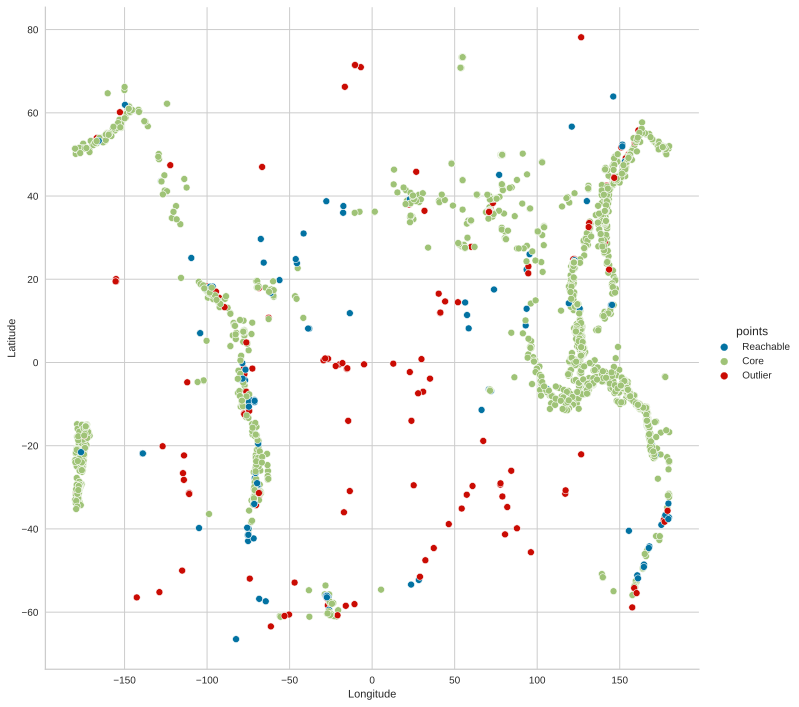

In [ ]:
draw_DBSCAN_points(data, cl_dbscan_mink)

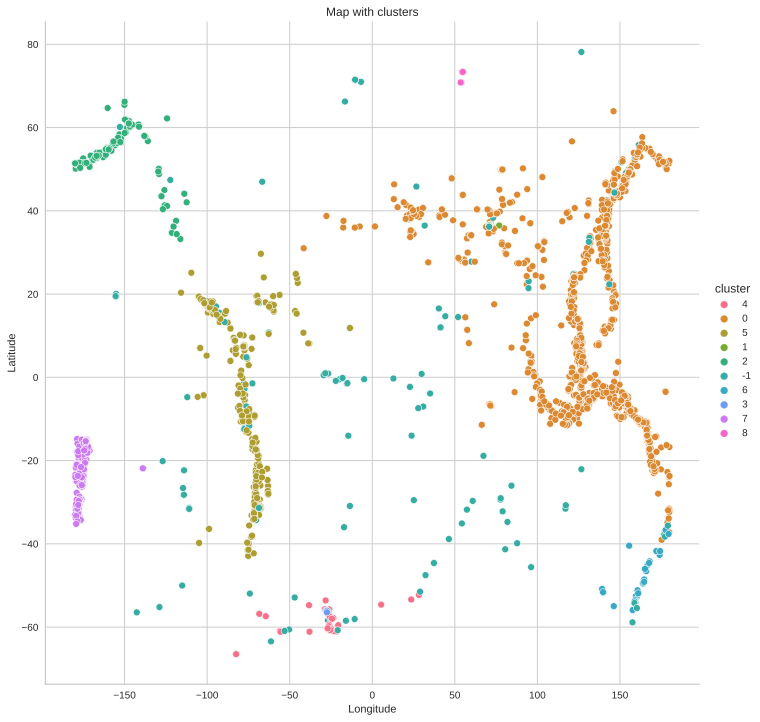

In [ ]:
draw_map_clusters(data, cl_dbscan_mink, 'db')

**Conclusion:**
* For the Minkowski Distance between objects, the algorithm managed to allocate 9 clusters and outliers.
The split was unsuccessful, since almost no clusters with the strongest and smallest earthquakes were identified.
* I think that the division turned out to be more along geographical lines.

### **4) Chebyshev distance**

In [ ]:
cl_dbscan_cheb = DBSCAN(eps=0.0056, min_samples=10, metric='chebyshev')

cl_dbscan_cheb.fit(quake_normalized)
pd.Series(cl_dbscan_cheb.labels_).value_counts()

 0    1417
 5     252
 6     174
-1     131
 2     121
 4      34
 7      22
 1      16
 3      10
dtype: int64

**Visualization**

* Let's look at how the objects were distributed into root, border, and outliers. It can be seen that almost all the objects turned out to be root, i.e. the density of objects is quite high with the selected parameters.


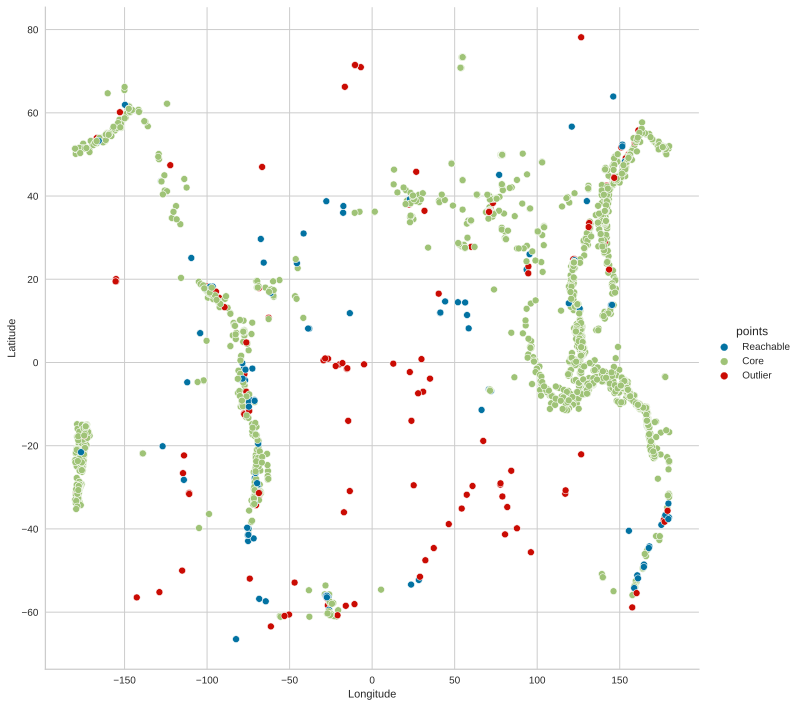

In [ ]:
draw_DBSCAN_points(data, cl_dbscan_cheb)

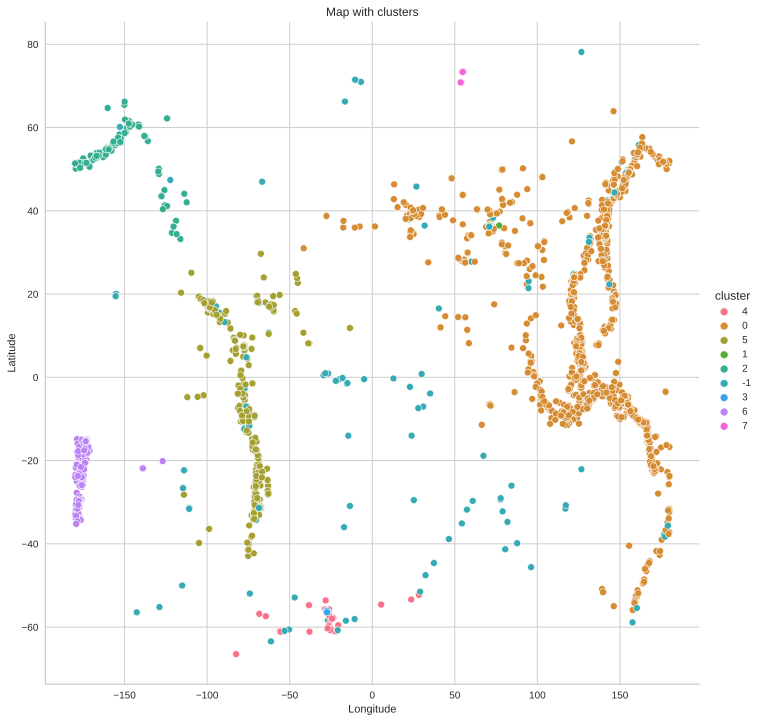

In [ ]:
draw_map_clusters(data, cl_dbscan_cheb, 'db')

**Conclusion:**
* For the Chebyshev Distance between objects, the algorithm managed to allocate 8 clusters and a lot of outliers.
The split was unsuccessful, since almost no clusters with the strongest and smallest earthquakes were identified.
* I think that the division turned out to be more along geographical lines.

### **General conclusion:**

* It is worth noting that the clusters obtained using the Euclidean distance and Manhattan blocks were more successful and find some structure depending on the depth of the earthquake. When visualizing, you can see several clusters, the splitting at first glance turned out to be quite good.
* Using the remaining distances, they show a greater separation by geographical objects.
* In general, the DBSCAN algorithm showed a good result, especially with the **distance of Manhattan blocks**, I consider other sections more unsuccessful.

## **OPTICS**

In [ ]:
from sklearn.cluster import OPTICS

In [ ]:
op_model = OPTICS(max_eps=0.0045, min_samples=10, metric='manhattan')
op_model.fit(quake_normalized)

pd.Series(op_model.labels_).value_counts()

-1     1705
 4       25
 30      22
 14      21
 31      21
 18      20
 1       19
 12      19
 10      18
 9       18
 7       18
 8       16
 27      16
 6       16
 16      15
 26      15
 2       14
 28      13
 20      13
 3       12
 24      12
 13      12
 15      12
 17      12
 25      12
 29      11
 21      10
 22      10
 19      10
 23      10
 5       10
 11      10
 0       10
dtype: int64

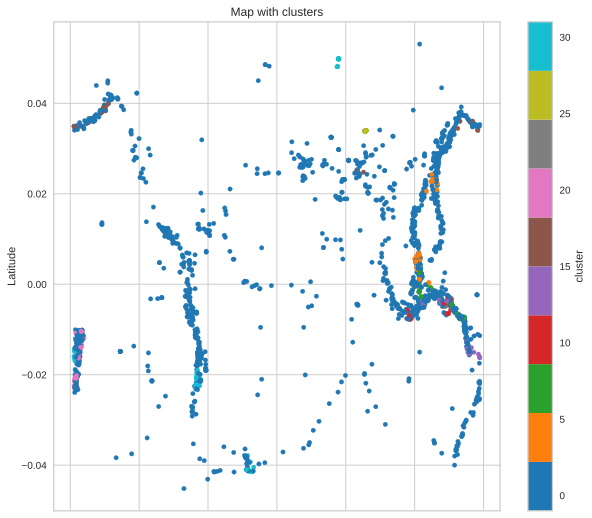

In [ ]:
draw_map_clusters(quake_normalized, op_model, 'km')

**Conclusion**

* Clustering turned out to be quite acceptable.
* In the lower left corner, we managed to divide the site into 2 clusters - this is quite an acceptable division, since looking at the world map by the strength of the earthquake, it is clear that this site can be divided into 2-3 clusters.* Also, a couple more clusters were highlighted throughout the map, mainly in places of very deep earthquakes. Of course, it was not possible to allocate all these places and there was a huge number of emissions.
* There are some patterns here, if you look more closely. In places such as South America, North America, Southeast Asia, and on tectonic boundaries near Oceania, the depth of an earthquake seems to be the deeper the farther it is from the border.

# **Metrics**


**Dbscan -- The distance of Manhattan blocks**

In [ ]:
db_lbl = cl_dbscan_cb.labels_
db_lbl

array([-1,  0,  0, ...,  0,  0,  0])

**Hierarchical clustering**  
* Euclidean distance -- The Ward method

In [ ]:
euc_ward = fcluster(Z6, t = 9, criterion='maxclust')
euc_ward

array([7, 6, 5, ..., 5, 5, 5], dtype=int32)

**KMeans**

In [ ]:
km = Z_15.labels_
km

array([5, 1, 1, ..., 8, 1, 9], dtype=int32)

**Conclusion:**  

* On this dataset, clustering methods such as **Hierarchical clustering (Ward's method)** and **K-means**, gave more interesting partitions. They **did a better** job with splitting the data into clusters.

* In these clustering, I decided to highlight **9** and leave the proposed **15 clusters**, since this number seemed to me the most successful in terms of the number of objects within one cluster.

* **Hierarchical clustering** only for Euclidean distance and ward distance showed good clustering. (9 clusters)

* **K-means** - I identified 15 clusters, in principle they are all balanced, there are smaller clusters, there are more, but there is no big imbalance and the map shows that this algorithm finds a complex structure.


## **Evaluation of clustering results using quality metrics:**

#### 1) Silhouette

* Does not imply knowledge of the true labels of objects, and allows you to evaluate the quality of clustering, using only the (unmarked) selection itself and the result of clustering.

* The silhouette of the sample is the average size of the silhouette of objects in this sample. Thus, the silhouette shows how the average distance to the objects of its cluster differs from the average distance to the objects of other clusters. This value lies in the range [-1, 1]. **Values close to -1** correspond to bad (scattered) clusterizations, **values close to zero** indicate that clusters intersect and overlap each other, **values close to 1** correspond to "dense" clearly highlighted clusters. Thus, ***the larger the silhouette, the more clearly the clusters*** are highlighted, and they are compact, densely grouped point clouds.

* Using the silhouette, you can choose the optimal number of clusters (if it is not known in advance) — the number of clusters that maximizes the silhouette value is selected.

#### 2) Davies-Bouldin

* The score is defined as the average similarity of each cluster with its most similar cluster, where similarity is the ratio of distances within the cluster to the distances between the clusters. Thus, clusters that are farther apart and less dispersed give a better result.

* **The minimum** score is **zero**, more **low** values indicate **the best** clustering.

In [ ]:
from sklearn.metrics import calinski_harabasz_score, adjusted_rand_score, adjusted_mutual_info_score, silhouette_score, silhouette_samples

label_cols = ['cl_kmeans', 'cl_dbscan', 'cl_agglomerative', 'cl_optics']

df = quake_normalized.copy()

df['cl_kmeans'] = Z_15.labels_.astype(int)

df['cl_dbscan'] = cl_dbscan_cb.labels_.astype(int)

df['cl_agglomerative'] = euc_ward

df['cl_optics'] = op_model.labels_

df.head(3)

,Focal depth,Latitude,Longitude,Richter,cl_kmeans,cl_dbscan,cl_agglomerative,cl_optics
0,0.013591,-0.035503,0.004632,0.021098,5,-1,7,-1
1,0.014827,0.030931,0.024704,0.020811,1,0,6,-1
2,0.023476,0.028431,0.023370,0.020811,1,0,5,-1


### **Unlabelled metrics**

In [ ]:
train = df.drop(['cl_kmeans', 'cl_dbscan', 'cl_agglomerative', 'cl_optics'], axis=1)
labels = [km, db_lbl, euc_ward, op_model.labels_]
cl_quality = []

for lbl in labels: 
    cl_quality.append(({ 
        'Silhouette': metrics.silhouette_score(train, lbl),
        'Davies-Bouldin': metrics.davies_bouldin_score(train, lbl)
        }))


results = pd.DataFrame(data=cl_quality, columns=['Silhouette', 'Davies-Bouldin'],
                       index=[ 'K-means', 'DBSCAN', 'Agglomerative', 'Optics'])

results

,Silhouette,Davies-Bouldin
K-means,0.382569,0.866718
DBSCAN,-0.028186,1.242642
Agglomerative,0.334814,0.960837
Optics,-0.432190,1.147787


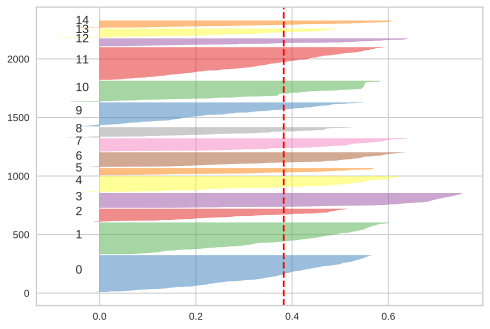

In [ ]:
visualizer = SilhouetteVisualizer(Z_15, colors='yellowbrick')
visualizer.fit(train)
plt.show()

**Conclusion**  

* The most successful division into clusters, the metric **KMeans** was said, because according to the metric **Silhouette**, it is clear that the value is close to 0, so the clusters intersect, and according to the metric **Davies-Bouldin** lower values indicate better clustering.
* According to the K Means algorithm and the cluster distribution, it is clear that the resulting clusters are not balanced, since the data and their structure were extremely complex. But in principle, the splitting is good.
* As expected, OPTICS & DBSCAN provide similar metrics.

### **Labeled metrics**

In [ ]:
label_cols = ['cl_kmeans', 'cl_dbscan', 'cl_agglomerative', 'cl_optics']

cl_quality = []

for lbl in label_cols: 
    cl_quality.append(({ 
        'Adjusted MI': adjusted_mutual_info_score(df["cl_kmeans"], df[lbl]),
        'Adjusted rand': adjusted_rand_score(df["cl_kmeans"], df[lbl]),
        'Calinski Harabasz': calinski_harabasz_score(quake_normalized, df[lbl])
        }))


results = pd.DataFrame(data=cl_quality, columns=['Adjusted MI', 'Adjusted rand', 'Calinski Harabasz'],
                       index=[ 'K-means', 'DBSCAN', 'Agglomerative', 'Optics'])

results

,Adjusted MI,Adjusted rand,Calinski Harabasz
K-means,1.000000,1.000000,1566.919866
DBSCAN,0.486534,0.209992,143.816252
Agglomerative,0.737133,0.536573,1403.503196
Optics,0.230579,0.000873,21.673126


**Conclusion**

* **AMI** function, which measures the consistency of the two appointments, ignoring permutations, perfect marking is estimated at 1.0. See that **agglomeration** clustering is more similar to the labels k-means and is close to 1.0.
* **Adjusted rate score** - is a function that measures the similarity of two appointments, ignoring permutations, perfect marking is estimated at 1.0. We see that both metrics clustering become worse, but  **agglomeration** clustering is still closer to kmeans.
* **Calinski Harabasz** - the ratio of the sum of the variance between clusters and the variance within the cluster for all clusters. We see that **agglomerative** clustering is very close to the value of k-means.

# **Interpretation of the resulting KMeans clusters**

* I chose the KMEANS partition, because in my opinion it turned out to be successful for this dataset and it is interesting to see what conclusions can be reached by using this clustering.

In [ ]:
kmeans_clustering = Z_15

In [ ]:
print('KMEANS clusters:')
pd.Series(kmeans_clustering.labels_).value_counts().sort_index()

KMEANS clusters:


0     314
1     268
2     108
3     125
4     134
5      59
6     124
7     110
8      84
9     202
10    175
11    277
12     65
13     73
14     59
dtype: int64

* Determine the greatest dependence of the features among themselves.

In [ ]:
for col in data.columns:
    print(f'CORR WITW {col}   :\n {data.corr()[col].sort_values()}\n\n**********************\n')

CORR WITW Focal depth   :
 Latitude      -0.235231
Richter       -0.003528
Longitude      0.111048
Focal depth    1.000000
Name: Focal depth, dtype: float64

**********************

CORR WITW Latitude   :
 Focal depth   -0.235231
Richter        0.059912
Longitude      0.135203
Latitude       1.000000
Name: Latitude, dtype: float64

**********************

CORR WITW Longitude   :
 Richter       -0.022119
Focal depth    0.111048
Latitude       0.135203
Longitude      1.000000
Name: Longitude, dtype: float64

**********************

CORR WITW Richter   :
 Longitude     -0.022119
Focal depth   -0.003528
Latitude       0.059912
Richter        1.000000
Name: Richter, dtype: float64

**********************



In [ ]:
df = data.copy(deep=True)
df['LABELS'] = kmeans_clustering.labels_.astype(int)

In [ ]:
df.head(3)

,Focal depth,Latitude,Longitude,Richter,LABELS
0,33.0,-52.26,28.30,NaN,5
1,36.0,45.53,150.93,5.8,1
2,57.0,41.85,142.78,5.8,1


**Longitude & Latitude**

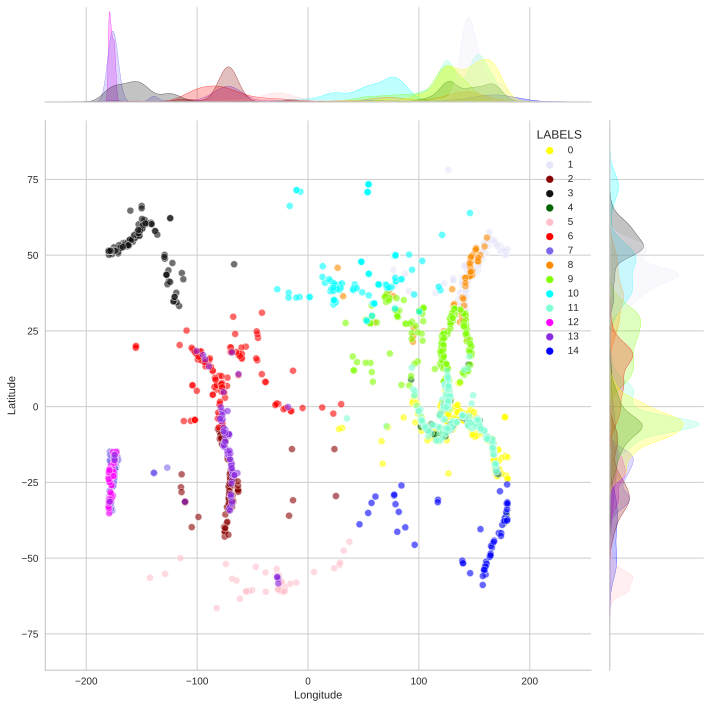

In [ ]:
colorful_scatter(df, "Longitude", "Latitude")

* Clusters 12 and 7 are located in the left part closer to the bottom. Most likely, their formation is justified by the different depth of the earthquake.
* 13, 6 and 2 also differ in the depth of earthquakes.
* Where cluster 8 is located, a large depth of earthquakes was also detected.
* The division does not exactly show the picture of the depth of earthquakes, but it is close to the truth.

**Focal depth & Latitude**

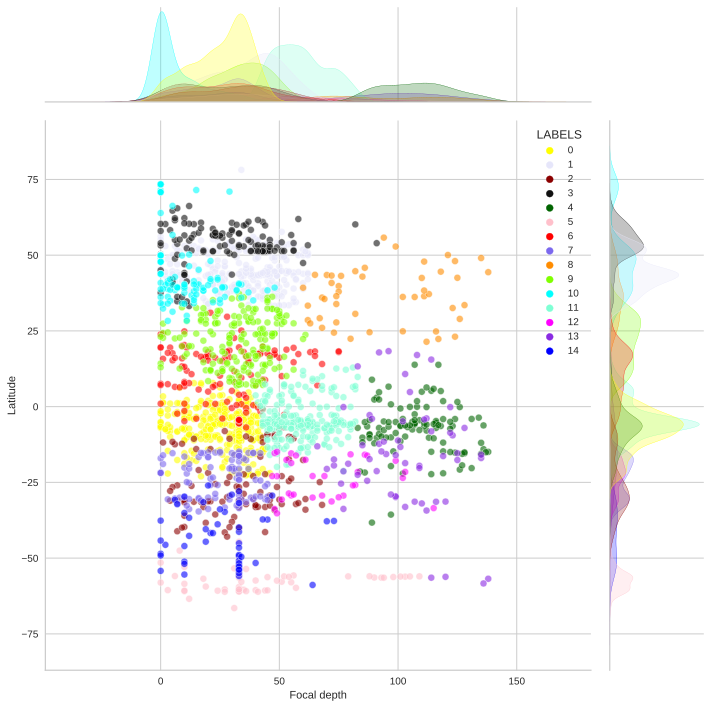

In [ ]:
colorful_scatter(df, "Focal depth", "Latitude")

* At first glance, we can say that the clusters are approximately the same.
* The depth of the epicenter is strongest in clusters 7 and 4, when viewed relative to latitude. 8 cluster also has a rather large depth of the epicenter.
* Many clusters are located in their latitudes, but there are also intersections, namely: (7 and 2), (6 and 9), (7 and 4).

**Focal depth & Longitude**

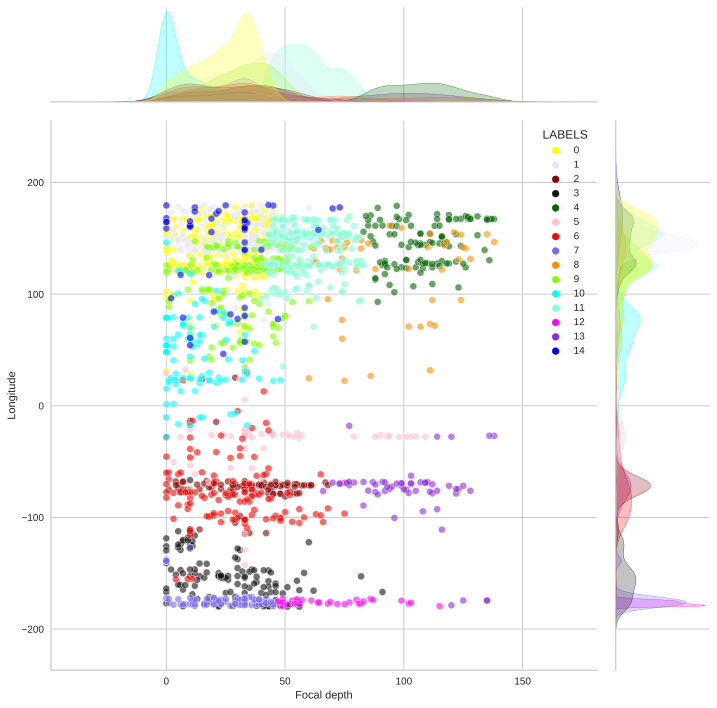

In [ ]:
colorful_scatter(df, "Focal depth", "Longitude")

* At first glance, we can say that the clusters are approximately the same.
* The depth of the epicenter is strongest at 4,8,13 clusters, when viewed relative to longitude.
* Many clusters are located in their latitudes, but there are also intersections, namely: (14,0,1,9), (6 and 2).


**Focal depth & Richter**

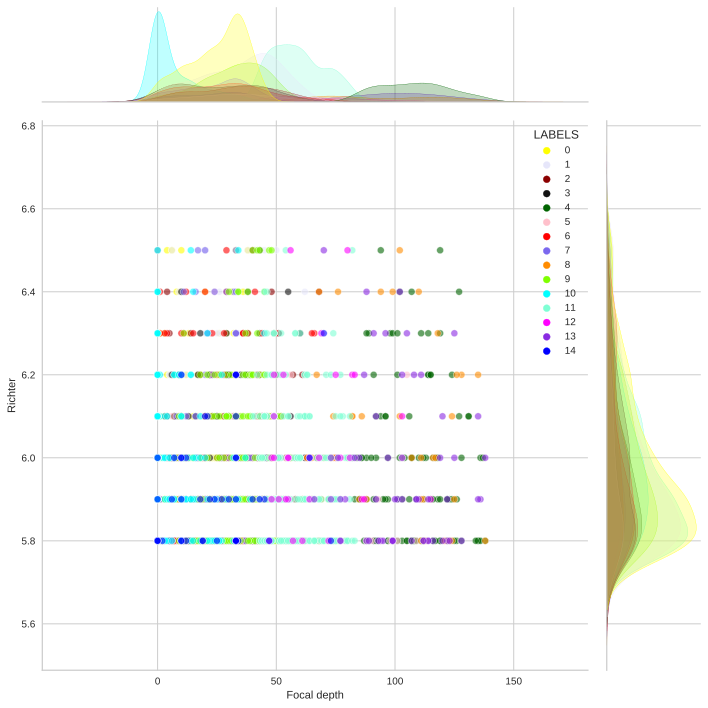

In [ ]:
colorful_scatter(df, "Focal depth", "Richter")

* The largest magnitude, but the smallest depth is at the 0 cluster.
* Cluster 14 has a small depth and also the magnitude varies from 5.8 to 6.2.
* 4.8.13 is clearly a large cluster of places with a large depth of earthquakes and a magnitude spread from 5.8 to 6.6.

**Conclusion**  
It is most logical to assume that: 
There seem to be some patterns here in data. In places like South America, North America, Southeastern Asia, and in the tectonic boundaries near Oceania, the depth of the earthquake seems to be deeper, the further it is from a boundary. The closer they are the shallower the earthquakes.

# **The world map**

In [ ]:
new = data.loc[:, ['Latitude', 'Longitude']]
new['cl_kmeans'] = Z_15.labels_.astype(int)
new

,Latitude,Longitude,cl_kmeans
0,-52.26,28.30,5
1,45.53,150.93,1
2,41.85,142.78,1
3,29.19,141.15,8
4,-21.66,169.81,0
...,...,...,...
2173,51.54,-173.11,3
2174,-10.16,161.01,4
2175,27.87,139.51,8
2176,36.43,140.98,1


**Clusters on world map**

In [ ]:
import plotly.graph_objects as go

mapbox_access_token ="pk.eyJ1IjoiZG9rdGFwb2xhIiwiYSI6ImNrbmJ1NW5nNjExY2kyb21ybmdsN3FieW8ifQ.NB-vO0wD7bCK3W_c3KDHLA"


site_lat = new['Latitude']
site_lon = new['Longitude']


fig = go.Figure()

fig.add_trace(go.Scattermapbox(
        lat=site_lat,
        lon=site_lon,
        mode='markers',
        marker=go.scattermapbox.Marker(
            size= 9,
            color=new['cl_kmeans'],
            colorscale='rainbow',
            opacity=0.7
        ),
        text="Latitude: " + data["Latitude"].astype(str) +
             "<br>Longitude: " + data["Longitude"].astype(str) +
             "<br>Focal depth: " + data["Focal depth"].astype(str) +
             "<br>Richter: " + data["Richter"].astype(str),
        hoverinfo='text'
    ))

fig.update_layout(
    title='KMeans Clustering',
    autosize=False,
    width=1050,
    height=700,
    hovermode='closest',
    showlegend=False,
    mapbox=dict(
        accesstoken=mapbox_access_token,
        bearing=0,
        center=dict(
            lat=38,
            lon=-94
        ),
        pitch=0,
        zoom=0.5,
        style='light',
    ),
)


fig.update_layout(mapbox_style="dark", mapbox_accesstoken=mapbox_access_token)

fig.show()

**Clusters on world map + tectonics plates**

In [ ]:
cluster_tectonics  = folium.Map(tiles="cartodbpositron", zoom_start=5)

gradient = {.33: "#628d82", .66: "#a3c5bf", 1: "#eafffd"} 

plates = list(pl_df["plate"].unique())
for plate in plates:
    plate_vals = pl_df[pl_df["plate"] == plate]
    lats = plate_vals["lat"].values
    lons = plate_vals["lon"].values
    points = list(zip(lats, lons))
    indexes = [None] + [i + 1 for i, x in enumerate(points) if i < len(points) - 1 and abs(x[1] - points[i + 1][1]) > 300] + [None]
    for i in range(len(indexes) - 1):
        folium.vector_layers.PolyLine(points[indexes[i]:indexes[i+1]], fill=False,  color="#58508d").add_to(cluster_tectonics)
        
def color_point(val):
            if val == 0:
                return 'Yellow'
            elif val == 1:
                return 'Lavender'
            elif val ==  2 :
                return 'DarkRed'
            elif val == 3 : 
               return 'k'
            elif val == 4 : 
               return 'DarkGreen'
            elif val == 5 : 
               return 'Pink'
            elif val ==  6 : 
               return 'Red'
            elif val ==  7 :
               return 'MediumSlateBlue'
            elif val ==  8 : 
               return 'DarkOrange'
            elif val == 9 : 
               return 'Chartreuse'
            elif val == 10 : 
               return 'Aqua'
            elif val == 11 :
               return 'Aquamarine'
            elif val == 12 :
               return 'Fuchsia'
            elif val == 13 : 
               return 'BlueViolet'
            elif val == 14 : 
               return 'Blue'
            
for i in range(0,len(new)):
    folium.Circle(location=[new.iloc[i]["Latitude"], new.iloc[i]["Longitude"]], radius=2000, color=color_point(new.iloc[i]["cl_kmeans"])).add_to(cluster_tectonics)

In [ ]:
cluster_tectonics

Output hidden; open in https://colab.research.google.com to view.

**Earthquakes by focal depth on world map + tectonics plates**

In [ ]:
Depth_tectonics

Output hidden; open in https://colab.research.google.com to view.

# **General conclusion**

* 4 clustering algorithms were used (KMeans, Agglomerative, DBSCAN, OPTICS), they showed more or less acceptable partitions. I also tried to use other algorithms, but they did not fit our data, although spectral clustering showed a good result if I had indicated the geographical component as the main idea of splitting into clusters.
* Of the 4 algorithms used, the KMeans algorithm showed the greatest accuracy, it allowed us to identify clusters by the depth of the earthquake. Of course, he did not perfectly cope with the task, but some of the main points were identified.
* Speaking about the selection of the optimal value of the number of clusters for KMeans, it turned out to choose 4-6 clusters (according to the elbow method), however, I believe that this division is more related to geographical features and the accumulation of the largest number of earthquakes in certain parts of the globe, but looking at the map of the edges of tectanic plates, you can see that the places of large clusters of earthquakes fall at the joints of several plates and, accordingly, it is not worth combining these objects into one cluster.
* Based on the metrics, we can say that indeed KMeans coped better than other algorithms, and OPTICS coped the worst, but this algorithm did a good job of finding clusters where there was the greatest depth of earthquakes. On the other hand, this algorithm has allocated a huge number of outliers, which is of course unacceptable.

**Ideas:**
* A Boolean feature * * is_land** was created, which showed whether the coordinates of the earthquake are in water or on the ground, it turned out that 1.5 of all earthquakes were in water (respectively, as well as tectanic plate faults). However, this feature could not be used, since we were deprived of the opportunity to navigate the depth of the earthquake by splits, geographical location began to play a big role.
* Also, perhaps in the future, it is possible to divide clusters better by knowing the continent(or country) where an earthquake occurred nearby, as well as the name of the tectonic plate, since some shift more often. To do this, I thought you need to take the approximate coordinates of earthquakes and look for places located nearby.

**World earthquake map with focal depth**  
* Based on the values on the earthquake map by their depth, the clustering of k-means shows similar results to my conclusions.

<p align="right">
  <img src="https://www.researchgate.net/publication/326011745/figure/fig1/AS:642148051476481@1530111434203/Worldwide-earthquake-distribution-showing-the-deepest-earthquake-locations-South.png" width="600">
</p>


